# SQL資料更新

In [1]:
####################################################################################################
#瘋狗流裝包
####################################################################################################
import pandas as pd
import numpy as np
import pyodbc
import warnings 
import warnings
warnings.filterwarnings("ignore")
from datetime import timedelta
import datetime
from interval3 import Interval, IntervalSet
from tqdm import tqdm
from scipy import stats
from importlib import reload
pd.set_option('display.max_rows', 150)
pd.set_option('display.max_columns', 150)
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
from scipy import stats
from scipy import stats
from scipy.stats.mstats import winsorize
import os
warnings.filterwarnings("ignore")

from matplotlib.font_manager import FontProperties
# myfont=FontProperties(fname=r'C:\Users\chiehlinchen\Desktop\msj.ttf',size=14)
# # sns.set(font=myfont.get_family(), rc={'figure.figsize':(5,4)}, font_scale= 2)
# # sns.set_style("whitegrid",{"font.sans-serif":['Microsoft JhengHei']})
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['axes.unicode_minus'] =False
plt.rcParams['axes.facecolor']='whitesmoke'

import plotly.express as px

In [2]:
####################################################################################################
#接數據庫
####################################################################################################


class get_df:

    def __init__(self):
        self.DB_infos = {"X01" : ("192.168.1.16", "X01", "cm23357868", "86875332")}
        self.querys = {}
        self.db = str()
        self.df_dict =  dict()
        self.w_code_dict = dict()
        self.point_dict = dict()
        self.result_dict = dict()
        
    def db_connect(self, DB_info):
        DB_Host, DB_Name, DB_User, DB_Password = self.DB_infos[DB_info]
        print("Connecting to database using pyodbc...")
        self.db = pyodbc.connect('DRIVER={ODBC Driver 13 for SQL Server}; SERVER=' + DB_Host + '; DATABASE=' + DB_Name + '; UID=' + DB_User + '; PWD=' + DB_Password)
        print("Succesfully Connected to database using pyodbc!")
      
    def load_data(self, query):
        df =  pd.read_sql(self.querys[query], self.db)
        return df
    
    @staticmethod
    def make_fitable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[資使用率]
                                    ,[融資維持率(%)]
                                    FROM [X01].[dbo].[日融資券排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_stocktable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[開盤價]
                                    ,[最高價]
                                    ,[最低價]
                                    ,[收盤價]
                                    ,[成交金額(千)]
                                    FROM [X01].[dbo].[日收盤表排行] WITH(NOLOCK)  where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_returntable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[還原收盤價]
                                    FROM [X01].[dbo].[日報酬率比較表] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_toshintable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[投信買賣超金額(千)]
                                    ,[投信持股比率(%)]
                                    ,[投信持股市值(百萬)]
                                    ,[投信持股成本]
                                    FROM [X01].[dbo].[日投信明細與排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and  日期 >= 20020101 order by 日期 """  
        return sql_stock_price

    @staticmethod
    def make_foregintable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[外資買賣超金額(千)]
                                    ,[外資持股比率(%)]
                                    ,[外資持股市值(百萬)]
                                    ,[外資持股成本]
                                    FROM [X01].[dbo].[日外資持股與排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and  日期 >= 20020101 order by 日期 """ 
        return sql_stock_price
    @staticmethod
    def make_ETF():
        sql_stock_price = """SELECT  [日期]
                                    ,[標的代號]
                                FROM [X01].[dbo].[ETF持股明細表] where 日期 >= 20020101 order by 日期""" 
        return sql_stock_price

In [3]:
s_code_df = pd.read_excel(r'C:\Users\larryx30\Desktop\ALLSTOCK.xlsx')
stock_ls = list(s_code_df.loc[0:,'NUM'])

In [4]:
Sql_Base = get_df()
Sql_Base.db_connect('X01')

Connecting to database using pyodbc...
Succesfully Connected to database using pyodbc!


In [5]:
Sql_Base.querys['日融資券排行'] = get_df.make_fitable()
fitable = Sql_Base.load_data('日融資券排行')

Sql_Base.querys['日收盤表排行'] = get_df.make_stocktable()
stocktable = Sql_Base.load_data('日收盤表排行')

Sql_Base.querys['日報酬率比較表'] = get_df.make_returntable()
returntable = Sql_Base.load_data('日報酬率比較表')

Sql_Base.querys['日投信明細與排行'] = get_df.make_toshintable()
toshintable = Sql_Base.load_data('日投信明細與排行')

Sql_Base.querys['日外資持股與排行'] = get_df.make_foregintable()
foregintable = Sql_Base.load_data('日外資持股與排行')
Sql_Base.querys['ETF持股明細表'] = get_df.make_ETF()
ETF = Sql_Base.load_data('ETF持股明細表')
ETF['是否為ETF成分股'] = 'E'
ETF = ETF.drop_duplicates().reset_index(drop = True)
ETF = ETF.rename(columns = {'標的代號':'股票代號'})

In [6]:
data_frame = stocktable.merge(fitable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(returntable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(toshintable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(foregintable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(ETF,on = ['日期','股票代號'],how = 'left')
data_frame['是否為ETF成分股'] = data_frame['是否為ETF成分股'].fillna('F')
data_frame = data_frame[data_frame['股票代號'].isin(s_code_df['NUM'])]
data_frame['日期'] = pd.to_datetime(data_frame['日期'],format = "%Y%m%d").fillna(0)
data_frame = data_frame.set_index('日期')

data_dict = {str(stock_ls[i]):data_frame[data_frame['股票代號'] == stock_ls[i]] for i in tqdm(range(len(stock_ls)))}

feature_ls = data_frame.columns[2:]
data_frame = data_frame.reset_index(drop = False)
data_pivots_ls = []
for feature in tqdm(feature_ls):
    data_pivot = data_frame.pivot('日期','股票代號',feature)
    data_pivots_ls.append(data_pivot)
pivot_dict = {str(feature_ls[i]):data_pivots_ls[i] for i in range(len(feature_ls))}

data_dict.update(pivot_dict)

100%|██████████| 17/17 [00:37<00:00,  2.21s/it]


In [7]:
response1 = pd.read_excel(r'C:\Users\larryx30\Desktop\ALLSTOCK.xlsx')
response1.index = response1.index+1
AS = response1['NUM']

response2 = pd.read_excel(r'C:\Users\larryx30\Desktop\TCRINEW.xlsx')
response2.index = response2.index+1
SKTCRI = response2['NUM']

response3 = pd.read_excel(r'C:\Users\larryx30\Desktop\STOCKFUTURE.xlsx')
response3.index = response3.index+1
SF = response3['NUM']

In [8]:
DDW = {}
for j in tqdm(AS):
    DDW[str(j)] = data_dict[str(j)].resample('W-FRI').agg({'開盤價':'first', '最高價':'max', '最低價':'min', '收盤價':'last','成交金額(千)':'sum','資使用率':'last','融資維持率(%)':'last', '還原收盤價':'last','投信持股比率(%)':'last','投信持股成本':'last','外資持股比率(%)':'last','外資持股成本':'last','投信持股市值(百萬)':'last','是否為ETF成分股':'last'}).fillna(method = 'pad' ,axis = 0)


100%|██████████| 1776/1776 [00:29<00:00, 59.86it/s]


# 計算大盤夏普

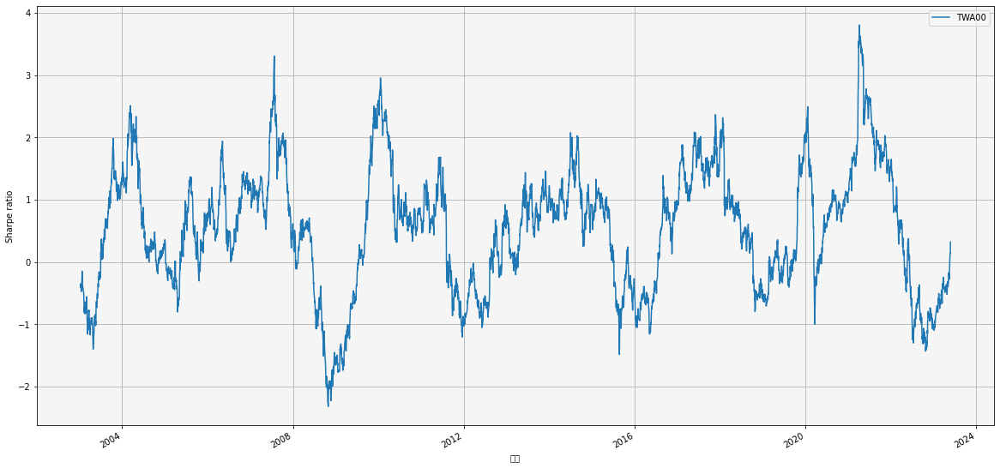

In [9]:
import matplotlib.pyplot as plt
import mplfinance as mpf
import seaborn as sns
shar2 = pd.DataFrame()

change2 = data_dict["TWA00"]["還原收盤價"].pct_change()
sigma2 = change2.std()
data_dict["TWA00"]['rolling_ret'] = change2.rolling(252).mean()
data_dict["TWA00"]['rolling_std'] = change2.rolling(252).std()
data_dict["TWA00"]['sharpe'] = (data_dict["TWA00"]['rolling_ret'] / data_dict["TWA00"]['rolling_std']) * (252 ** 0.5)

APT2 = data_dict["TWA00"]["sharpe"]
APT2.name = 'TWA00'
DDW['TWA00']["sharpe"] = data_dict['TWA00']['sharpe'].groupby(pd.Grouper(freq='1W')).tail(1)
if len(shar2) == 0:
    shar2 = APT2
else:
    shar2 = pd.merge(shar2,APT2,left_on = shar2.index,right_on = APT2.index,how = 'outer')
    shar2.set_index('key_0',inplace = True)

plt.figure(figsize=(8,3))
plt.xlabel("time")
plt.ylabel("Sharpe ratio")
shar2.plot(figsize=(20, 10),label = "TWA00",grid = True)
plt.legend()

# 計算全股票夏普

100%|██████████| 1776/1776 [00:53<00:00, 33.47it/s]


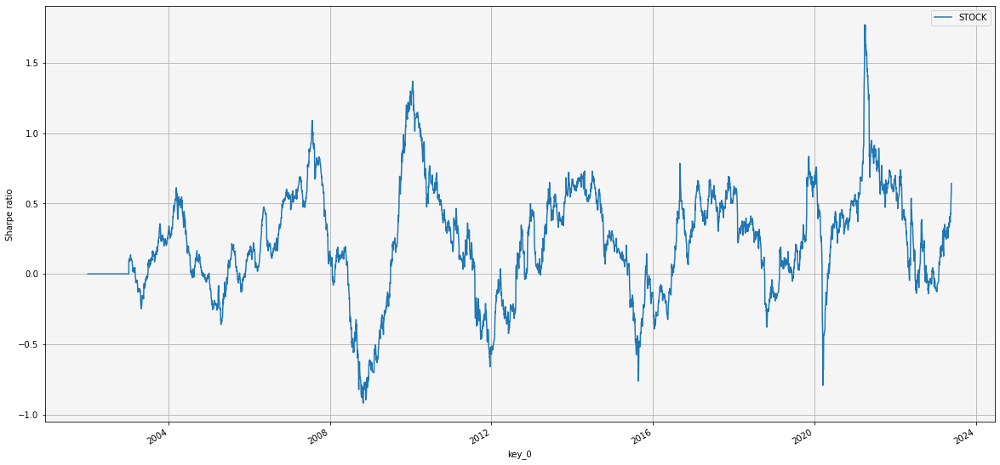

In [10]:
#Sharpe
shar = pd.DataFrame()

for i in tqdm(AS):
    change = data_dict[str(i)]["還原收盤價"].pct_change()
    sigma = change.std()
    data_dict[str(i)]['rolling_ret'] = change.rolling(252).mean()
    data_dict[str(i)]['rolling_std'] = change.rolling(252).std()
    data_dict[str(i)]['sharpe'] = (data_dict[str(i)]['rolling_ret'] / data_dict[str(i)]['rolling_std']) * (252 ** 0.5)

    APT = data_dict[str(i)]["sharpe"]
    APT.name = i

    if len(shar) == 0:
        shar = APT
    else:
        shar = pd.merge(shar,APT,left_on = shar.index,right_on = APT.index,how = 'outer')
        shar.set_index('key_0',inplace = True)

plt.figure(figsize=(8,3))
plt.xlabel("time")
plt.ylabel("Sharpe ratio")
wholesharpe = shar.sort_index().sum(axis = 1)/len(shar.columns)
wholesharpe.plot(figsize=(20, 10),label = "STOCK",grid = True)
plt.legend()
plt.savefig("一籃子夏普")

# 母關鍵點策略

100%|██████████| 1098/1098 [03:10<00:00,  5.78it/s]


Text(0, 0.5, 'Profit')

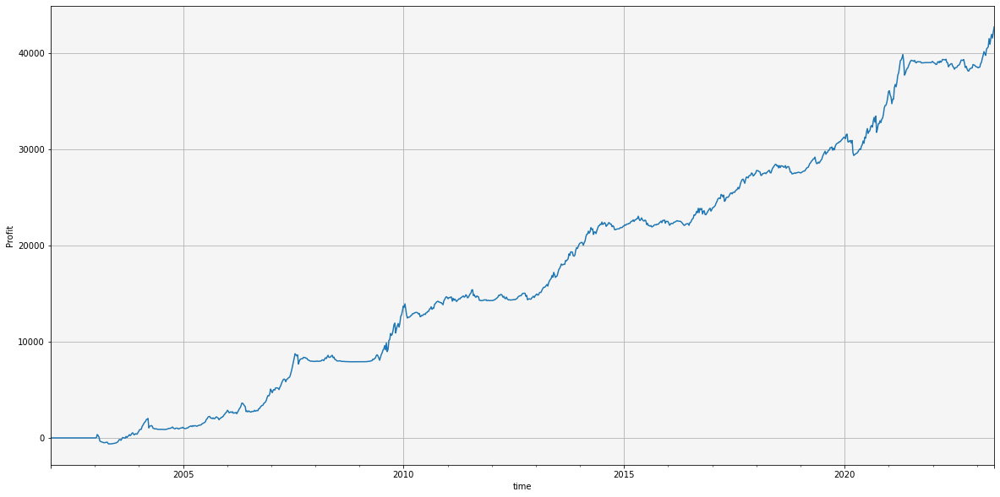

In [11]:
import talib
ERROR = []
trr = pd.DataFrame()
pz = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['MAX52'] = DDW[str(x)]["還原收盤價"].rolling(52).max()
    DDW[str(x)]["MAX52S"] = DDW[str(x)]["MAX52"].shift(1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    DDW[str(x)]['一籃子夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    KPBS = 0
    KPBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["MAX52S"].iloc[z] and  DDW[str(x)]["成交金額(千)"].iloc[z] > 50000 and  DDW[str(x)]["資使用率"].iloc[z] < 15 \
        and DDW[str(x)]["成交金額(千)"].shift(1).iloc[z] > 20000 and DDW[str(x)]["還原收盤價"].iloc[z] < 200 and DDW[str(x)]['大盤夏普'].iloc[z] < 1.5 :
        
            KPBS = 1

        elif (DDW[str(x)]["4MA"].iloc[z] < DDW[str(x)]["4MAS"].iloc[z] and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z])   :
            KPBS = 0
            #buy.append("0")
        KPBUY.append(KPBS)
    DDW[str(x)]["KPBUY"] = KPBUY
    DDW[str(x)]["KPBUYS"] = DDW[str(x)]["KPBUY"].shift(1)
    pzb = DDW[str(x)]["KPBUYS"]  
    pzb.name = str(x)
    pzbs = DDW[str(x)]["KPBUY"]
    pzbs.name = str(x)
    DDW[str(x)]["KPRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["KPBUYS"].dropna().astype(int)
    PT = DDW[str(x)]["KPRR"]
    PT.name = str(x)
    if len(trr) == 0:
        trr = PT
    else:
        trr = pd.merge(trr,PT,left_on = trr.index,right_on = PT.index,how = 'outer')
        trr.set_index('key_0',inplace = True)
    if len(pz) == 0:
        pz = pzbs
    else:
        pz = pd.merge(pz,pzbs,left_on = pz.index,right_on = pzbs.index,how = 'outer')
        pz.set_index('key_0',inplace = True)

trrb =trr.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

plt.xlabel("time")
plt.ylabel("Profit")


In [12]:
trr.sort_index().sum(axis = 1).cumsum().tail(10)

key_0
2023-03-24    40437.170493
2023-03-31    40552.791268
2023-04-07    40667.709498
2023-04-14    41523.172863
2023-04-21    40927.501242
2023-04-28    41535.452126
2023-05-05    41967.885916
2023-05-12    41582.393048
2023-05-19    42196.221820
2023-05-26    42738.922741
dtype: float64

# 整理多單買賣訊01值

77.63652641002686
0.0
288.0


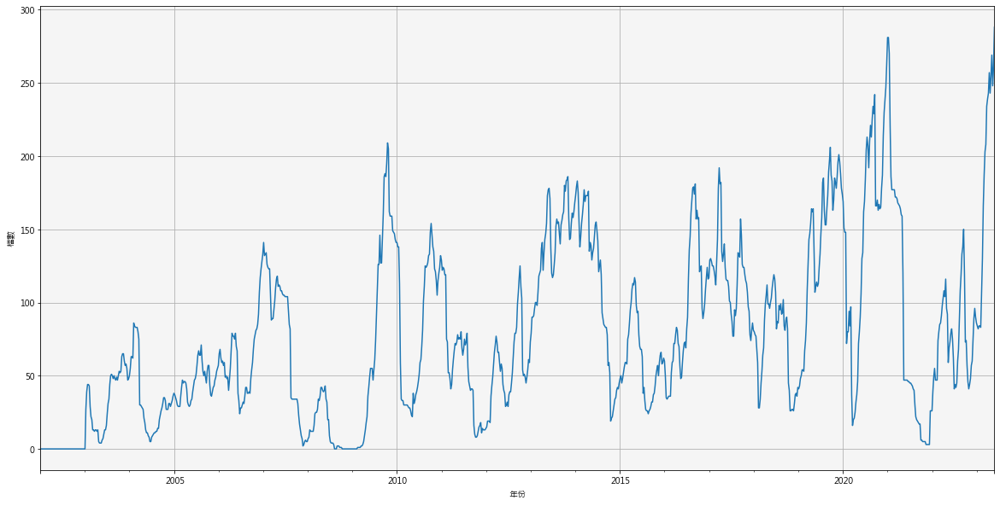

In [13]:
pz1 = pz.sort_index()
f = lambda x :float(x)
pz2 = pz1.applymap(f)
pz3 = pz2.sum(axis=1)
pz4 = pz3.groupby(pd.Grouper(freq='1W')).tail(1)
plt.rcParams['font.family'] = ['Microsoft JhengHei'] # 中文標籤
plt.rcParams['axes.unicode_minus'] = False # 負號
print(pz4.mean())
print(pz4.min())
print(pz4.max())
pz4.plot(figsize=(20, 10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('多方部位變化表.png')


# 填寫資料更新日期

In [14]:
當週日期 = trr.index[-1]
前週日期 = trr.index[-2]

# 關鍵點當週買進部位

In [15]:
關鍵點持有部位 = pz2.loc[當週日期][(pz2.loc[當週日期]==1)]
關鍵點買進 = pz2.loc[當週日期][(pz2.loc[當週日期]==1) & (pz2.loc[前週日期]==0)]
關鍵點賣出 = pz2.loc[當週日期][(pz2.loc[當週日期]==0) & (pz2.loc[前週日期]==1)]
print("關鍵點買進標的")
print(關鍵點買進)
print("關鍵點買進檔數" , len(關鍵點買進))
print("關鍵點持有部位數目" , len(關鍵點持有部位))
print("關鍵點賣出部位")
print(關鍵點賣出)
print("關鍵點賣出檔數" , len(關鍵點賣出))


關鍵點買進標的
2201    1.0
2399    1.0
2457    1.0
2467    1.0
2536    1.0
3025    1.0
3028    1.0
3094    1.0
3163    1.0
3265    1.0
3306    1.0
3479    1.0
3483    1.0
3646    1.0
4744    1.0
4747    1.0
5243    1.0
5439    1.0
6179    1.0
6223    1.0
6245    1.0
6274    1.0
6569    1.0
6672    1.0
6698    1.0
8099    1.0
8155    1.0
9911    1.0
Name: 2023-05-26 00:00:00, dtype: float64
關鍵點買進檔數 28
關鍵點持有部位數目 288
關鍵點賣出部位
1786    0.0
Name: 2023-05-26 00:00:00, dtype: float64
關鍵點賣出檔數 1


# 關鍵點歷年損益

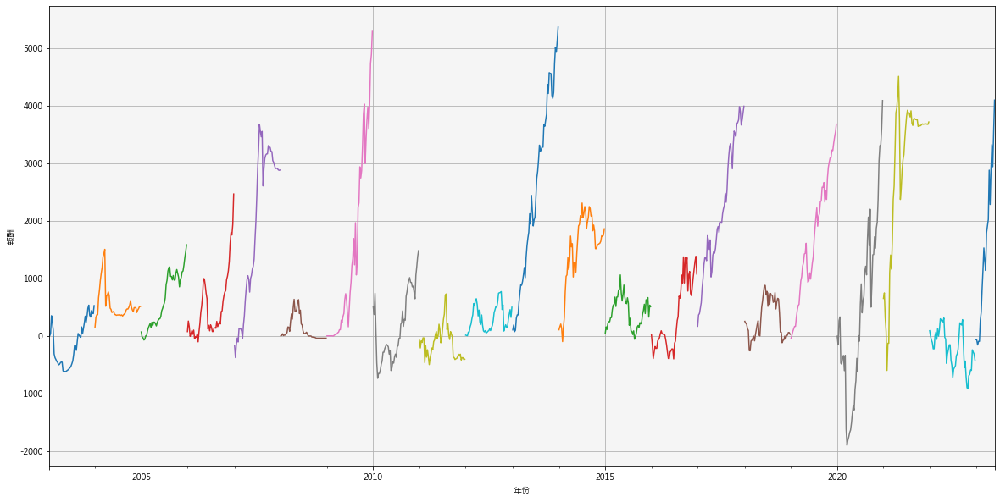

In [16]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrt = trr.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtfig = trrt.plot(figsize=(20, 10),grid = True)
trrtfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtfig.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\關鍵點歷年損益.png')


# 查詢式關鍵點損益

In [17]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
trrtall = pd.Series()
for h in yl :
    trrt = trr.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtall = pd.concat([trrtall,trrt])
trrtall = pd.DataFrame(trrtall)    

In [18]:
trrtall = trrtall.reset_index(drop = False)
trrtall = trrtall.rename(columns = {'index':'datetime',0:'returns'})

In [19]:
trrtall['2003'] = np.where(trrtall.datetime<'2004-01-01',trrtall['returns'],np.nan)
trrtall['2004'] = np.where(((trrtall.datetime<'2005-01-01') & (trrtall.datetime>='2004-01-01')),trrtall['returns'],np.nan)
trrtall['2005'] = np.where(((trrtall.datetime<'2006-01-01') & (trrtall.datetime>='2005-01-01')),trrtall['returns'],np.nan)
trrtall['2006'] = np.where(((trrtall.datetime<'2007-01-01') & (trrtall.datetime>='2006-01-01')),trrtall['returns'],np.nan)
trrtall['2007'] = np.where(((trrtall.datetime<'2008-01-01') & (trrtall.datetime>='2007-01-01')),trrtall['returns'],np.nan)
trrtall['2008'] = np.where(((trrtall.datetime<'2009-01-01') & (trrtall.datetime>='2008-01-01')),trrtall['returns'],np.nan)
trrtall['2009'] = np.where(((trrtall.datetime<'2010-01-01') & (trrtall.datetime>='2009-01-01')),trrtall['returns'],np.nan)
trrtall['2010'] = np.where(((trrtall.datetime<'2011-01-01') & (trrtall.datetime>='2010-01-01')),trrtall['returns'],np.nan)
trrtall['2011'] = np.where(((trrtall.datetime<'2012-01-01') & (trrtall.datetime>='2011-01-01')),trrtall['returns'],np.nan)
trrtall['2012'] = np.where(((trrtall.datetime<'2013-01-01') & (trrtall.datetime>='2012-01-01')),trrtall['returns'],np.nan)
trrtall['2013'] = np.where(((trrtall.datetime<'2014-01-01') & (trrtall.datetime>='2013-01-01')),trrtall['returns'],np.nan)
trrtall['2014'] = np.where(((trrtall.datetime<'2015-01-01') & (trrtall.datetime>='2014-01-01')),trrtall['returns'],np.nan)
trrtall['2015'] = np.where(((trrtall.datetime<'2016-01-01') & (trrtall.datetime>='2015-01-01')),trrtall['returns'],np.nan)
trrtall['2016'] = np.where(((trrtall.datetime<'2017-01-01') & (trrtall.datetime>='2016-01-01')),trrtall['returns'],np.nan)
trrtall['2017'] = np.where(((trrtall.datetime<'2018-01-01') & (trrtall.datetime>='2017-01-01')),trrtall['returns'],np.nan)
trrtall['2018'] = np.where(((trrtall.datetime<'2019-01-01') & (trrtall.datetime>='2018-01-01')),trrtall['returns'],np.nan)
trrtall['2019'] = np.where(((trrtall.datetime<'2020-01-01') & (trrtall.datetime>='2019-01-01')),trrtall['returns'],np.nan)
trrtall['2020'] = np.where(((trrtall.datetime<'2021-01-01') & (trrtall.datetime>='2020-01-01')),trrtall['returns'],np.nan)
trrtall['2021'] = np.where(((trrtall.datetime<'2022-01-01') & (trrtall.datetime>='2021-01-01')),trrtall['returns'],np.nan)
trrtall['2022'] = np.where(((trrtall.datetime<'2023-01-01') & (trrtall.datetime>='2022-01-01')),trrtall['returns'],np.nan)
trrtall['2023'] = np.where(((trrtall.datetime<'2024-01-01') & (trrtall.datetime>='2023-01-01')),trrtall['returns'],np.nan)

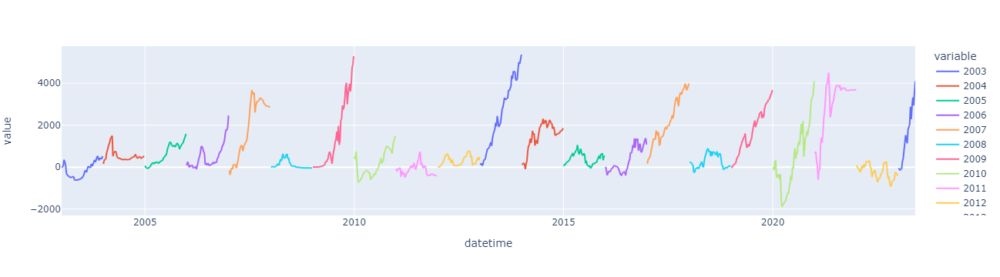

In [20]:
px.line(trrtall, x = 'datetime', y= yl)

# 放空補丁策略

In [21]:
import talib
ERROR = []
trrs = pd.DataFrame()
pzs = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['LOW5'] = DDW[str(x)]["收盤價"].rolling(2).min()
    DDW[str(x)]['SMAX3'] = DDW[str(x)]["最高價"].rolling(2).max()
    DDW[str(x)]["LOW5S"] = DDW[str(x)]["LOW5"].shift(1)
    DDW[str(x)]["4SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=4, matype=0)
    DDW[str(x)]["COVERMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=7, matype=0)
    DDW[str(x)]["SCHECKMA"] = talib.MA(DDW[str(x)]["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["4SELLMAS"] = DDW[str(x)]["4SELLMA"].shift(1)
    DDW[str(x)]["30SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["60SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    
    DDW['TWA00']['4SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=2, matype=0)
    DDW['TWA00']['20SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=20, matype=0)
    
    BSS = 0
    SELL =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['成交金額(千)'].iloc[z] > 100000 and DDW[str(x)]["30SELLMA"].iloc[z] < DDW[str(x)]["30SELLMA"].shift(1).iloc[z] \
        and DDW[str(x)]["還原收盤價"].iloc[z]  <  DDW[str(x)]["60SELLMA"].iloc[z] and DDW[str(x)]["SCHECKMA"].iloc[z] < DDW[str(x)]["SCHECKMA"].shift(4).iloc[z]\
        and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['LOW5S'].iloc[z]  and DDW[str(x)]['資使用率'].iloc[z] > 3 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 140 :
         
            BSS = -1

        elif   (DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['COVERMA'].iloc[z] and DDW[str(x)]['COVERMA'].iloc[z] > DDW[str(x)]['COVERMA'].shift(1).iloc[z]) \
         or DDW[str(x)]['融資維持率(%)'].iloc[z] < 130 or DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]["COVERMA"].iloc[z] :
            BSS = 0
        # or 
        #DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]['最高價'].shift(4).iloc[z] or
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        SELL.append(BSS)
    DDW[str(x)]["SELL"] = SELL
    DDW[str(x)]["SELLS"] = DDW[str(x)]["SELL"].shift(1)
    ps = DDW[str(x)]["SELLS"]  
    ps.name = str(x)
    pss = DDW[str(x)]["SELL"]
    pss.name = str(x)
    DDW[str(x)]["SRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["SELLS"].dropna().astype(int)
    PTS = DDW[str(x)]["SRR"]
    PTS.name = str(x)
    if len(trrs) == 0:
        trrs = PTS
    else:
        trrs = pd.merge(trrs,PTS,left_on = trrs.index,right_on = PTS.index,how = 'outer')
        trrs.set_index('key_0',inplace = True)
    if len(pzs) == 0:
        pzs = pss
    else:
        pzs = pd.merge(pzs,pss,left_on = pzs.index,right_on = pss.index,how = 'outer')
        pzs.set_index('key_0',inplace = True)

trrsp = trrs.sort_index().sum(axis = 1).cumsum()


100%|██████████| 1098/1098 [02:36<00:00,  7.01it/s]


<AxesSubplot:xlabel='key_0'>

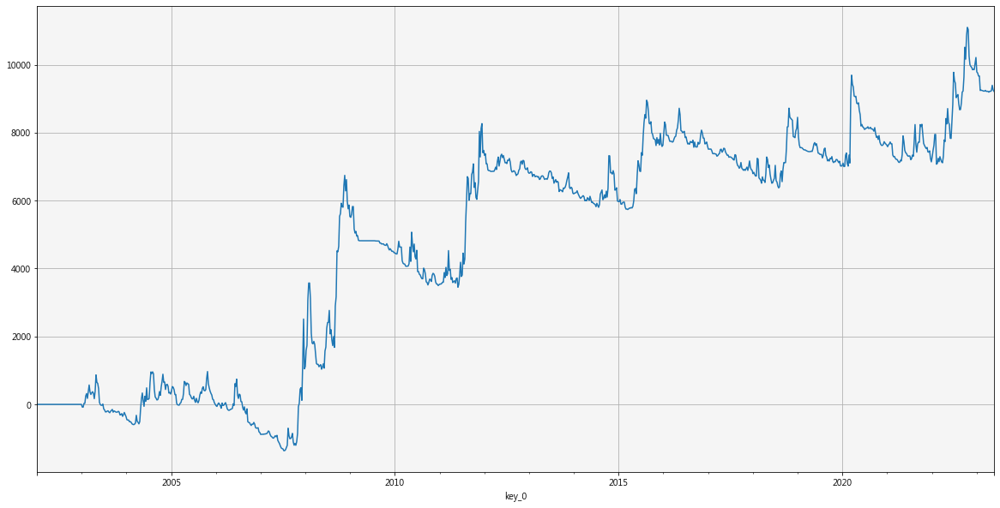

In [22]:
trrsp.plot(figsize = (20,10),grid = True)

# 整理空單買賣訊01值

-48.00089525514772
-177.0
0.0


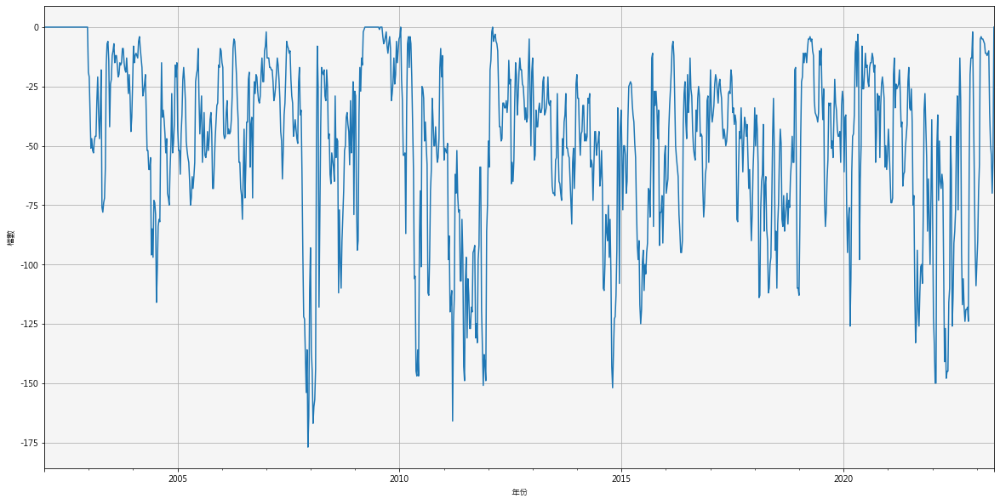

In [23]:
pzs1 = pzs.sort_index()
f1 = lambda x :float(x)
pzs2 = pzs1.applymap(f1)
pzs3 = pzs2.sum(axis=1)
pzs4 = pzs3.groupby(pd.Grouper(freq='1W')).tail(1)
print(pzs4.mean())
print(pzs4.min())
print(pzs4.max())
pzs4.plot(figsize=(20,10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('空方部位變化表.png')
pzs4.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\空單部位變化.xlsx')

In [24]:
trrsp['2023']

key_0
2023-01-06    9791.288219
2023-01-13    9759.327102
2023-01-20    9672.359631
2023-01-27    9672.359631
2023-02-03    9243.928403
2023-02-10    9253.372527
2023-02-17    9245.658391
2023-02-24    9237.120346
2023-03-03    9225.805695
2023-03-10    9225.506819
2023-03-17    9247.123718
2023-03-24    9219.169959
2023-03-31    9218.199163
2023-04-07    9219.611775
2023-04-14    9195.335273
2023-04-21    9221.603787
2023-04-28    9217.869153
2023-05-05    9236.560226
2023-05-12    9396.033840
2023-05-19    9265.132064
2023-05-26    9219.471712
dtype: float64

# 空單當週放空部位

In [25]:
空單放空部位 = pzs2.loc[當週日期][(pzs2.loc[當週日期]== -1)]
空單放空 = pzs2.loc[當週日期][(pzs2.loc[當週日期]== -1) & (pzs2.loc[前週日期]==0)]
空單回補 = pzs2.loc[當週日期][(pzs2.loc[當週日期]==0) & (pzs2.loc[前週日期]==-1)]
print("空單放空標的")
print(空單放空)
print("空單放空檔數" , len(空單放空))
print("空單持有空單部位數目" , len(空單放空部位))
print("空單回補部位")
print(空單回補)
print("空單回補檔數" , len(空單回補))

空單放空標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
空單放空檔數 0
空單持有空單部位數目 0
空單回補部位
1314    0.0
1565    0.0
1701    0.0
1708    0.0
1760    0.0
2014    0.0
2328    0.0
2337    0.0
2340    0.0
2401    0.0
2417    0.0
2534    0.0
2603    0.0
2607    0.0
2609    0.0
2615    0.0
2753    0.0
3016    0.0
3030    0.0
3062    0.0
3092    0.0
3189    0.0
3272    0.0
3374    0.0
3454    0.0
3504    0.0
3532    0.0
3580    0.0
3588    0.0
4116    0.0
4128    0.0
4162    0.0
4551    0.0
4721    0.0
4739    0.0
5015    0.0
5457    0.0
6153    0.0
6182    0.0
6202    0.0
6205    0.0
6213    0.0
6217    0.0
6237    0.0
6456    0.0
6510    0.0
6568    0.0
6706    0.0
6781    0.0
8028    0.0
8183    0.0
8261    0.0
8916    0.0
8924    0.0
8938    0.0
9802    0.0
Name: 2023-05-26 00:00:00, dtype: float64
空單回補檔數 56


In [26]:
#空單放空部位

# 空單歷年損益

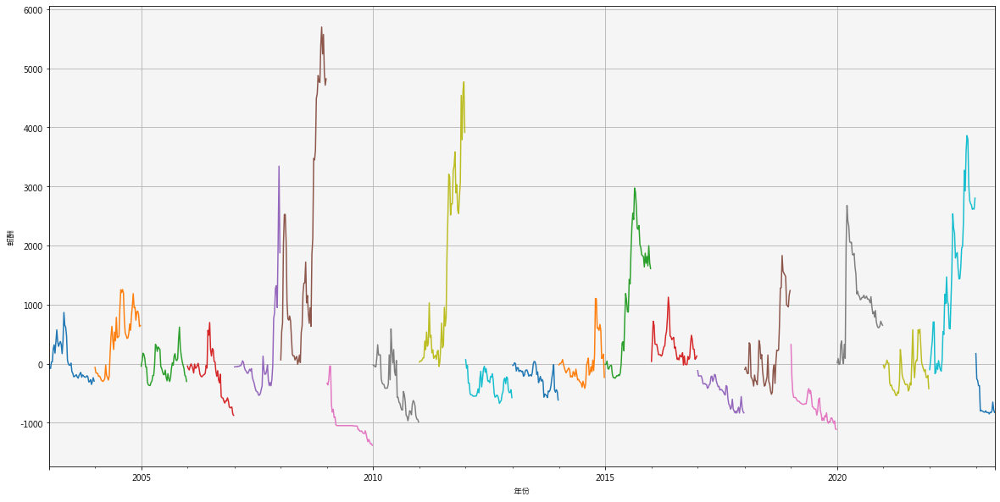

In [27]:

yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrts = trrs.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtsfig = trrts.plot(figsize=(20,10),grid = True)
trrtsfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtfig.savefig('空單歷年損益.png')

# 查詢式空單損益

In [28]:
 yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']

trrtsall = pd.Series()
for h in yl :
    trrts = trrs.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtsall = pd.concat([trrtsall,trrts])
trrtsall = pd.DataFrame(trrtsall)

In [29]:
trrtsall = trrtsall.reset_index(drop = False)
trrtsall = trrtsall.rename(columns = {'index':'datetime',0:'returns'})

In [30]:
trrtsall['2003'] = np.where(trrtsall.datetime<'2004-01-01',trrtsall['returns'],np.nan)
trrtsall['2004'] = np.where(((trrtsall.datetime<'2005-01-01') & (trrtsall.datetime>='2004-01-01')),trrtsall['returns'],np.nan)
trrtsall['2005'] = np.where(((trrtsall.datetime<'2006-01-01') & (trrtsall.datetime>='2005-01-01')),trrtsall['returns'],np.nan)
trrtsall['2006'] = np.where(((trrtsall.datetime<'2007-01-01') & (trrtsall.datetime>='2006-01-01')),trrtsall['returns'],np.nan)
trrtsall['2007'] = np.where(((trrtsall.datetime<'2008-01-01') & (trrtsall.datetime>='2007-01-01')),trrtsall['returns'],np.nan)
trrtsall['2008'] = np.where(((trrtsall.datetime<'2009-01-01') & (trrtsall.datetime>='2008-01-01')),trrtsall['returns'],np.nan)
trrtsall['2009'] = np.where(((trrtsall.datetime<'2010-01-01') & (trrtsall.datetime>='2009-01-01')),trrtsall['returns'],np.nan)
trrtsall['2010'] = np.where(((trrtsall.datetime<'2011-01-01') & (trrtsall.datetime>='2010-01-01')),trrtsall['returns'],np.nan)
trrtsall['2011'] = np.where(((trrtsall.datetime<'2012-01-01') & (trrtsall.datetime>='2011-01-01')),trrtsall['returns'],np.nan)
trrtsall['2012'] = np.where(((trrtsall.datetime<'2013-01-01') & (trrtsall.datetime>='2012-01-01')),trrtsall['returns'],np.nan)
trrtsall['2013'] = np.where(((trrtsall.datetime<'2014-01-01') & (trrtsall.datetime>='2013-01-01')),trrtsall['returns'],np.nan)
trrtsall['2014'] = np.where(((trrtsall.datetime<'2015-01-01') & (trrtsall.datetime>='2014-01-01')),trrtsall['returns'],np.nan)
trrtsall['2015'] = np.where(((trrtsall.datetime<'2016-01-01') & (trrtsall.datetime>='2015-01-01')),trrtsall['returns'],np.nan)
trrtsall['2016'] = np.where(((trrtsall.datetime<'2017-01-01') & (trrtsall.datetime>='2016-01-01')),trrtsall['returns'],np.nan)
trrtsall['2017'] = np.where(((trrtsall.datetime<'2018-01-01') & (trrtsall.datetime>='2017-01-01')),trrtsall['returns'],np.nan)
trrtsall['2018'] = np.where(((trrtsall.datetime<'2019-01-01') & (trrtsall.datetime>='2018-01-01')),trrtsall['returns'],np.nan)
trrtsall['2019'] = np.where(((trrtsall.datetime<'2020-01-01') & (trrtsall.datetime>='2019-01-01')),trrtsall['returns'],np.nan)
trrtsall['2020'] = np.where(((trrtsall.datetime<'2021-01-01') & (trrtsall.datetime>='2020-01-01')),trrtsall['returns'],np.nan)
trrtsall['2021'] = np.where(((trrtsall.datetime<'2022-01-01') & (trrtsall.datetime>='2021-01-01')),trrtsall['returns'],np.nan)
trrtsall['2022'] = np.where(((trrtsall.datetime<'2023-01-01') & (trrtsall.datetime>='2022-01-01')),trrtsall['returns'],np.nan)
trrtsall['2023'] = np.where(((trrtsall.datetime<'2024-01-01') & (trrtsall.datetime>='2023-01-01')),trrtsall['returns'],np.nan)

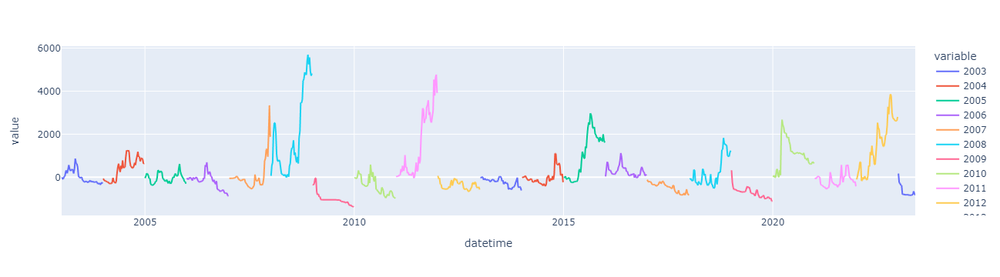

In [31]:
px.line(trrtsall, x = 'datetime', y= yl)

# 欄位檢查

In [32]:
DDW['2330'].tail(10)

,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-03-24,517.0,539.0,510.0,539.0,67901987.0,0.27,176.761902,539.0,0.69,502.56,72.01,337.94,95757.12,E,576.01,584.81,517.742,512.984,4.054054,-0.316062,-0.316062,0,0.0,0.0,518.0,539.0,513.0,520.115,520.855714,497.075,512.4275,494.0015,494.0015,0,0.0,0.0
2023-03-31,533.0,538.0,524.0,533.0,51998568.0,0.26,174.188599,533.0,0.68,502.61,72.06,338.69,94504.78,E,554.50,576.01,522.692,517.742,-1.113173,-0.427550,-0.427550,0,0.0,-0.0,533.0,539.0,518.0,525.060,519.560000,501.650,520.1150,498.8210,498.8210,0,0.0,-0.0
2023-04-07,530.0,535.0,526.0,531.0,20034032.0,0.26,173.432098,531.0,0.68,502.64,72.08,339.00,94158.13,E,549.61,554.50,526.248,522.692,-0.375235,-0.488749,-0.488749,0,0.0,-0.0,531.0,538.0,533.0,530.250,521.815714,503.850,525.0600,501.2905,501.2905,0,0.0,-0.0
2023-04-14,533.0,533.0,510.0,516.0,54381282.0,0.27,168.218704,516.0,0.68,502.69,72.04,339.60,90393.25,E,545.70,549.61,527.400,526.248,-2.824859,-0.461690,-0.461690,0,0.0,-0.0,516.0,535.0,531.0,529.750,522.922857,504.750,530.2500,502.4660,502.4660,0,0.0,-0.0
2023-04-21,519.0,520.0,509.0,511.0,53127985.0,0.26,166.557495,511.0,0.67,502.78,72.01,340.19,88445.22,E,542.07,545.70,526.000,527.400,-0.968992,-0.436927,-0.436927,0,0.0,-0.0,511.0,533.0,516.0,522.750,522.605714,505.675,529.7500,503.6635,503.6635,0,0.0,-0.0
2023-04-28,505.0,510.0,489.0,502.0,82002589.0,0.27,164.136505,502.0,0.67,502.70,71.86,340.98,86804.39,E,542.07,542.07,518.600,526.000,-1.761252,-0.362288,-0.362288,0,0.0,-0.0,502.0,520.0,511.0,515.000,521.428571,506.700,522.7500,504.9550,504.9550,0,0.0,-0.0
2023-05-05,500.0,502.0,495.0,500.0,25645830.0,0.26,163.582199,500.0,0.67,502.68,71.83,341.25,86658.93,E,542.07,542.07,512.000,518.600,-0.398406,-0.385295,-0.385295,0,0.0,-0.0,500.0,510.0,502.0,507.250,518.857143,508.150,515.0000,506.5315,506.5315,0,0.0,-0.0
2023-05-12,509.0,510.0,495.0,496.0,42424883.0,0.27,162.438904,496.0,0.67,502.69,71.79,341.71,86294.74,E,542.07,542.07,505.000,512.000,-0.800000,-0.210928,-0.210928,0,0.0,-0.0,496.0,510.0,500.0,502.250,512.714286,510.200,507.2500,508.7040,508.7040,0,0.0,-0.0
2023-05-19,497.0,536.0,494.5,532.0,85637843.0,0.23,173.851807,532.0,0.66,502.76,71.99,342.83,91289.13,E,542.07,542.07,508.200,505.000,7.258065,0.018122,0.018122,0,0.0,0.0,496.0,536.0,496.0,507.500,512.571429,514.375,502.2500,512.9995,512.9995,0,0.0,0.0


# ETF限制型空單

100%|██████████| 1098/1098 [02:35<00:00,  7.05it/s]


<AxesSubplot:xlabel='key_0'>

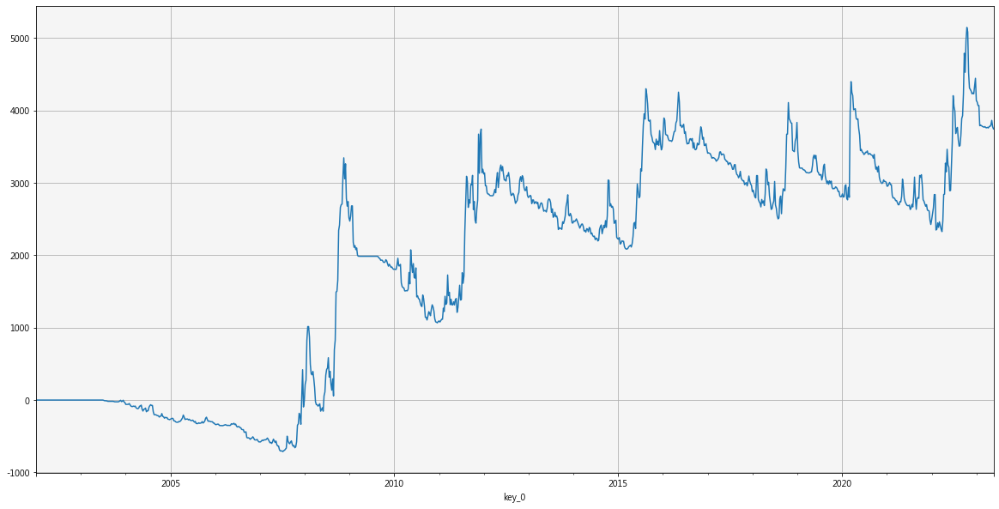

In [33]:
#ETF篩選後
import talib
ERROR = []
trrsETF = pd.DataFrame()
pzsETF = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['LOW5'] = DDW[str(x)]["收盤價"].rolling(2).min()
    DDW[str(x)]['SMAX3'] = DDW[str(x)]["最高價"].rolling(2).max()
    DDW[str(x)]["LOW5S"] = DDW[str(x)]["LOW5"].shift(1)
    DDW[str(x)]["4SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=4, matype=0)
    DDW[str(x)]["COVERMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=7, matype=0)
    DDW[str(x)]["SCHECKMA"] = talib.MA(DDW[str(x)]["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["4SELLMAS"] = DDW[str(x)]["4SELLMA"].shift(1)
    DDW[str(x)]["30SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["60SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW['TWA00']['4SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=2, matype=0)
    DDW['TWA00']['20SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    BSSETF = 0
    SELLETF =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['成交金額(千)'].iloc[z] > 100000 and DDW[str(x)]["30SELLMA"].iloc[z] < DDW[str(x)]["30SELLMA"].shift(1).iloc[z] \
        and DDW[str(x)]["還原收盤價"].iloc[z]  <  DDW[str(x)]["60SELLMA"].iloc[z] and DDW[str(x)]["SCHECKMA"].iloc[z] < DDW[str(x)]["SCHECKMA"].shift(4).iloc[z]\
        and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['LOW5S'].iloc[z]  and DDW[str(x)]['資使用率'].iloc[z] > 3 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 140:
            if DDW[str(x)]['是否為ETF成分股'].iloc[z] == 'E':
                BSSETF = -1
            
            elif SELLETF[-1] == -1:
                BSSETF = -1

            else:
                BSSETF = 0

        elif   (DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['COVERMA'].iloc[z] and DDW[str(x)]['COVERMA'].iloc[z] > DDW[str(x)]['COVERMA'].shift(1).iloc[z]) \
         or DDW[str(x)]['融資維持率(%)'].iloc[z] < 130 or DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]["COVERMA"].iloc[z] :
            BSSETF = 0
        # or 
        #DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]['最高價'].shift(4).iloc[z] or
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        SELLETF.append(BSSETF)
    DDW[str(x)]["SELLETF"] = SELLETF
    DDW[str(x)]["SELLSETF"] = DDW[str(x)]["SELLETF"].shift(1)
    ps = DDW[str(x)]["SELLSETF"]  
    ps.name = str(x)
    pss = DDW[str(x)]["SELLETF"]
    pss.name = str(x)
    DDW[str(x)]["SRRETF"] = DDW[str(x)]["DR"] * DDW[str(x)]["SELLSETF"].dropna().astype(int)
    PTS = DDW[str(x)]["SRRETF"]
    PTS.name = str(x)
    if len(trrsETF) == 0:
        trrsETF = PTS
    else:
        trrsETF = pd.merge(trrsETF,PTS,left_on = trrsETF.index,right_on = PTS.index,how = 'outer')
        trrsETF.set_index('key_0',inplace = True)
    if len(pzsETF) == 0:
        pzsETF = pss
    else:
        pzsETF = pd.merge(pzsETF,pss,left_on = pzsETF.index,right_on = pss.index,how = 'outer')
        pzsETF.set_index('key_0',inplace = True)

trrspETF = trrsETF.sort_index().sum(axis = 1).cumsum()
trrspETF.plot(figsize=(20, 10),grid = True)

<AxesSubplot:xlabel='key_0'>

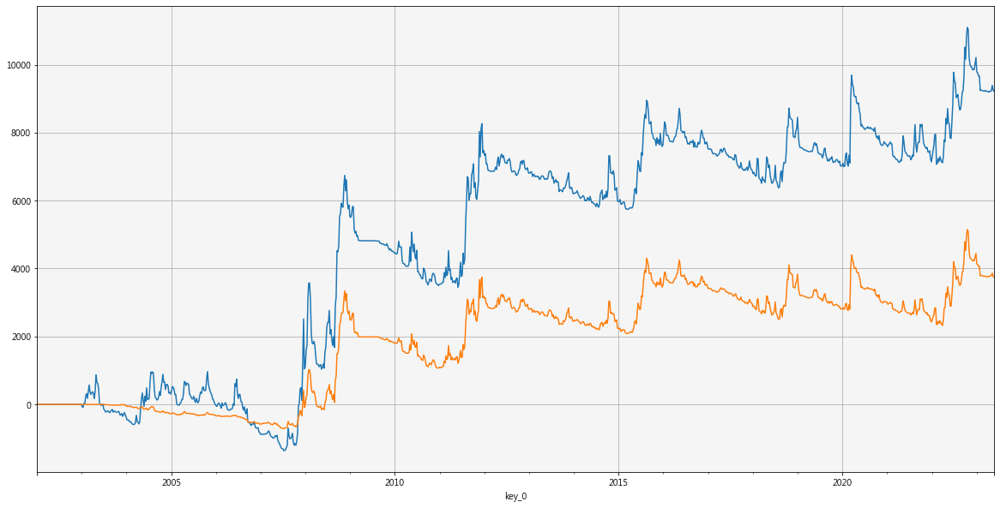

In [34]:
trrsp.plot(figsize = (20,10),grid = True)
(trrspETF*1).plot(figsize=(20, 10),grid = True)

# 整理限制型空單01值

-25.131602506714415
-102.0
0.0


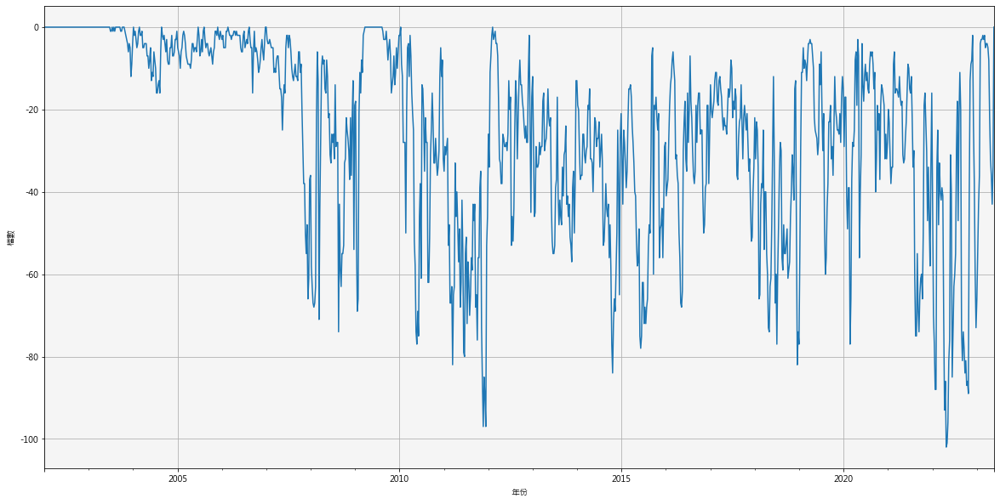

In [35]:
pzs1ETF = pzsETF.sort_index()
f1 = lambda x :float(x)
pzs2ETF = pzs1ETF.applymap(f1)
pzs3ETF = pzs2ETF.sum(axis=1)
pzs4ETF = pzs3ETF.groupby(pd.Grouper(freq='1W')).tail(1)
print(pzs4ETF.mean())
print(pzs4ETF.min())
print(pzs4ETF.max())
pzs4ETF.plot(figsize=(20,10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('空方部位變化表.png')
pzs4ETF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\ETF空單部位變化.xlsx')

<AxesSubplot:xlabel='key_0'>

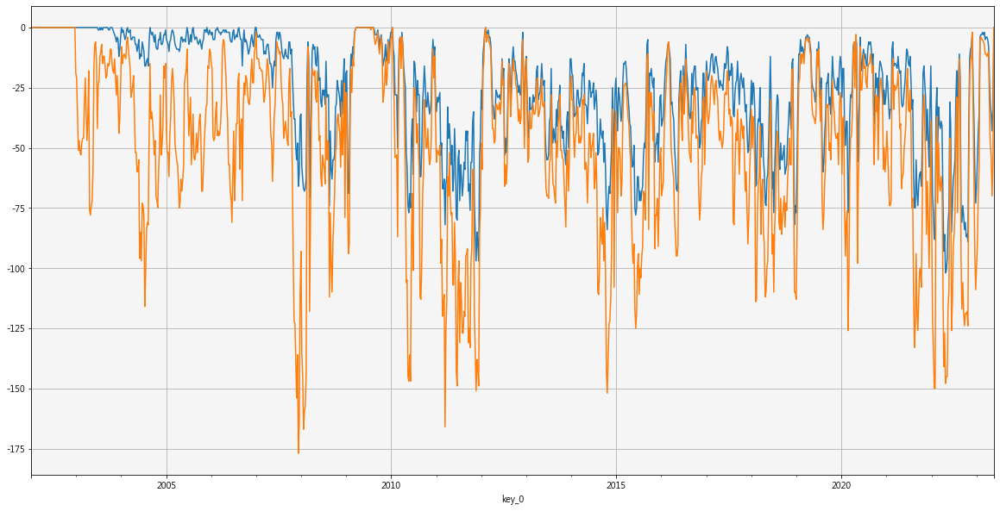

In [36]:
pzs4ETF.plot(figsize=(20,10),grid = True)
pzs4.plot(figsize=(20,10),grid = True)

In [37]:
ETF空單放空部位 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]== -1)]
ETF空單放空 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]== -1) & (pzs2ETF.loc[前週日期]==0)]
ETF空單回補 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]==0) & (pzs2ETF.loc[前週日期]==-1)]
print("ETF空單放空標的")
print(ETF空單放空)
print("ETF空單放空檔數" , len(ETF空單放空))
print("ETF空單持有空單部位數目" , len(ETF空單放空部位))
print("ETF空單回補部位")
print(ETF空單回補)
print("ETF空單回補檔數" , len(ETF空單回補))

ETF空單放空標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
ETF空單放空檔數 0
ETF空單持有空單部位數目 0
ETF空單回補部位
1314    0.0
1565    0.0
2014    0.0
2328    0.0
2337    0.0
2340    0.0
2401    0.0
2534    0.0
2603    0.0
2607    0.0
2609    0.0
2615    0.0
2753    0.0
3016    0.0
3030    0.0
3062    0.0
3189    0.0
3374    0.0
3454    0.0
3504    0.0
3532    0.0
4128    0.0
4162    0.0
6153    0.0
6182    0.0
6202    0.0
6213    0.0
6456    0.0
6510    0.0
6706    0.0
6781    0.0
8028    0.0
8938    0.0
9802    0.0
Name: 2023-05-26 00:00:00, dtype: float64
ETF空單回補檔數 34


# 台積電策略

In [38]:
import talib
ERROR = []
trr2330 = pd.DataFrame()
pz2330 = pd.DataFrame()


    
DDW['2330']['MAXN2330'] = DDW['2330']["還原收盤價"].rolling(4).max()
DDW['2330']["MAXNS"] = DDW['2330']["MAXN2330"].shift(1)
DDW['2330']['MINN2330'] = DDW['2330']["還原收盤價"].rolling(4).min()
DDW['2330']["MINNS"] = DDW['2330']["MINN2330"].shift(1)
DDW['2330']["2330MA"] = talib.MA(DDW['2330']["還原收盤價"].dropna(), timeperiod=20, matype=0)
DDW['2330']["2330SMA"] = DDW['2330']["2330MA"].shift(1)
DDW['2330']["2330LMA"] = talib.MA(DDW['2330']["還原收盤價"].dropna(), timeperiod=20, matype=0)
DDW['2330']["DR"] = ((DDW['2330']["還原收盤價"] - DDW['2330']["還原收盤價"].shift(1))/DDW['2330']["還原收盤價"].shift(1))*100
DDW['TWA00']['4SHMA'] = talib.MA(DDW['TWA00']["sharpe"].dropna(), timeperiod=4, matype=0)
DDW['TWA00']['20SHMA'] = talib.MA(DDW['TWA00']["sharpe"].dropna(), timeperiod=20, matype=0)
DDW['2330']['出場價'] = DDW['2330']["最低價"].rolling(4).min().shift(1)
BS2330 = 0
BUY2330 =[]
for z in range(len(DDW['2330'])):

    if  DDW['2330']["還原收盤價"].iloc[z]  >  DDW['2330']["2330MA"].iloc[z] and DDW['2330']['收盤價'].iloc[z] > DDW['2330']['最高價'].rolling(2).max().shift(1).iloc[z] \
    and   DDW['TWA00']['4SHMA'].iloc[z] < 0.3 :
         BS2330 = 1

    elif  DDW['2330']["收盤價"].iloc[z] < DDW['2330']["出場價"].iloc[z]   :
        BS2330 = 0
        
    
        BS2330 = 0
        #buy.append("0")
    BUY2330.append(BS2330)
DDW['2330']["BUY2330"] = BUY2330
DDW['2330']["BUY2330S"] = DDW['2330']["BUY2330"].shift(1)
pz2330 = DDW['2330']["BUY2330S"]  
pz2330.name = '2330'
pzz2330 = DDW['2330']["BUY2330"]
pzz2330.name = '2330'
DDW['2330']["2330RR"] = DDW['2330']["DR"] * DDW['2330']["BUY2330S"].dropna().astype(int)
PTS2330 = DDW['2330']["2330RR"]
PTS2330.name = '2330'
if len(trr2330) == 0:
    trr2330 = PTS2330
else:
    trr2330 = pd.merge(trr2330,PTS2330,left_on = trrs.index,right_on = PTS.index,how = 'outer')
    trr2330.set_index('key_0',inplace = True)



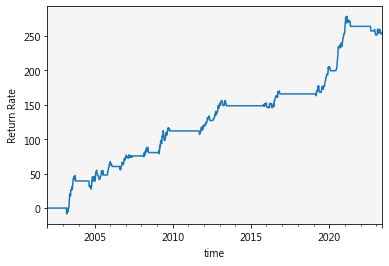

In [39]:
trr2330fig = trr2330.cumsum().plot()
trr2330fig = plt.gcf()
plt.xlabel("time")
plt.ylabel("Return Rate")
trr2330fig.savefig('2330')

# 全市場夏普處理與合併

In [40]:
# 日期處理及設定reblance間隔

#設定rebalance頻率及sharpe觀察日數
rebalance = 52

#設定納入股票檔數
count = 10
fee = 2
#主程式
shar = pd.DataFrame()

#計算個股Sharpe ratio
for i in tqdm(DDW.keys()):
    change = DDW[str(i)]["還原收盤價"].pct_change()
    sigma = change.std()
    DDW[str(i)]['rolling_ret'] = change.rolling(rebalance).mean()
    DDW[str(i)]['rolling_std'] = change.rolling(rebalance).std()
    DDW[str(i)]['sharpe105'] = DDW[str(i)]['rolling_ret'] / DDW[str(i)]['rolling_std']
    APT = DDW[str(i)]["sharpe105"]
    APT.name = str(i)

    if len(shar) == 0:
        shar = APT
    else:
        shar = pd.merge(shar,APT,left_on = shar.index,right_on = APT.index,how = 'outer')
        shar.set_index('key_0',inplace = True)
        shar.index.name = '日期'
shar1 = shar.quantile(0.99,axis= 1)
shar2 = pd.DataFrame(shar1.sort_index()).rename(columns = {0.99:'sharp1'})
for key in tqdm(DDW.keys()):
    DDW[key] =  DDW[key].merge(shar2,left_index=True,right_index = True,how='left')
DDW['2330'].tail(1)

100%|██████████| 1776/1776 [00:01<00:00, 1407.45it/s]


,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR,SELLETF,SELLSETF,SRRETF,MAXN2330,MAXNS,MINN2330,MINNS,2330MA,2330SMA,2330LMA,出場價,BUY2330,BUY2330S,2330RR,rolling_ret,rolling_std,sharpe105,sharp1
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-05-26,532.0,545.0,524.0,543.0,67051984.0,0.0,0.0,543.0,0.0,0.0,0.0,0.0,0.0,F,543.0,542.07,514.6,508.2,2.067669,0.018122,0.018122,0,0.0,0.0,532.0,545.0,496.0,517.75,514.285714,518.6,507.5,517.348,517.348,0,0.0,0.0,0,0.0,0.0,543.0,532.0,496.0,496.0,517.348,512.9995,517.348,489.0,1,1.0,2.067669,0.001789,0.043353,0.04127,0.370481


# 去除多欄(資料多_X才處理)

In [41]:
#for key in tqdm(DDW.keys()):
    #DDW[key] = DDW[key].drop(columns = ['sharp1_x','sharp1_y'])

# M夏普策略

In [42]:
import talib
ERROR = []
trrmsharpe = pd.DataFrame()
pzmsp = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    BQT = 0
    BUYQT =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['sharpe105'].iloc[z] > DDW[str(x)]['sharp1'].iloc[z]  and DDW[str(x)]['成交金額(千)'].iloc[z] > 30000 and DDW[str(x)]['sharpe105'].iloc[z] > 0 \
        and DDW[str(x)]['資使用率'].iloc[z] < 30 and DDW[str(x)]['大盤夏普'].iloc[z] > 0.4 and  DDW[str(x)]['大盤夏普'].iloc[z] < 1.5:
            BQT = 1

        elif   DDW[str(x)]["收盤價"].iloc[z] < DDW[str(x)]["最低價"].shift(1).rolling(4).min().iloc[z] or DDW[str(x)]['大盤夏普'].iloc[z] < 0:
            BQT = 0
        
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        BUYQT.append(BQT)
    DDW[str(x)]["BUYQT"] = BUYQT
    DDW[str(x)]["BUYQTS"] = DDW[str(x)]["BUYQT"].shift(1)
    tqt = DDW[str(x)]["BUYQTS"]  
    tqt.name = str(x)
    pqt = DDW[str(x)]["BUYQT"]
    pqt.name = str(x)
    DDW[str(x)]["QTRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["BUYQTS"].dropna().astype(int)
    PQT = DDW[str(x)]["QTRR"]
    PQT.name = str(x)    
    if len(trrmsharpe) == 0:
        trrmsharpe = PQT
    else:
        trrmsharpe = pd.merge(trrmsharpe,PQT,left_on = trrmsharpe.index,right_on = PQT.index,how = 'outer')
        trrmsharpe.set_index('key_0',inplace = True)
    if len(pzmsp) == 0:
        pzmsp = pqt
    else:
        pzmsp = pd.merge(pzmsp,pqt,left_on = pzmsp.index,right_on = pqt.index,how = 'outer')
        pzmsp.set_index('key_0',inplace = True)

tqt1 = trrmsharpe.sort_index().sum(axis = 1).cumsum()


100%|██████████| 1098/1098 [05:17<00:00,  3.46it/s]


<AxesSubplot:xlabel='key_0'>

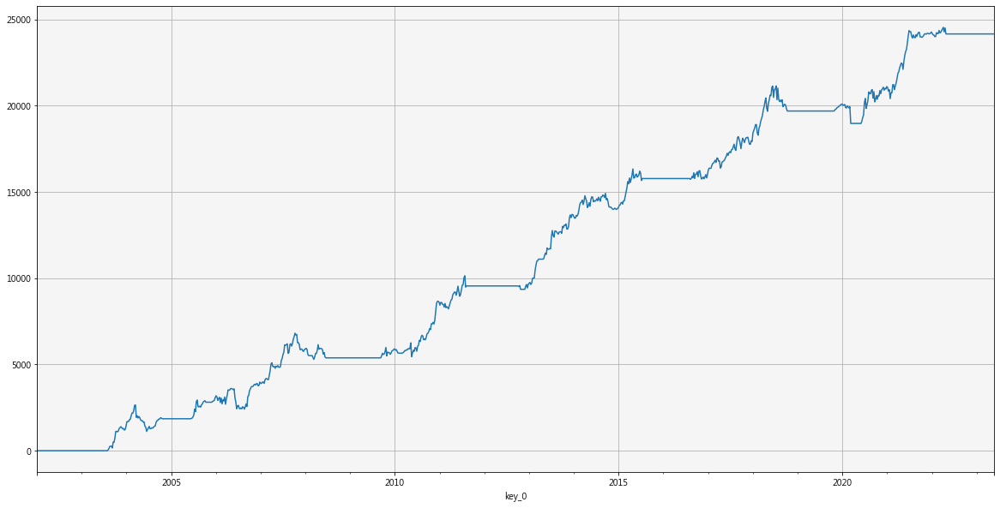

In [43]:
(tqt1*6).plot(figsize = (20,10),grid = True)

# 查詢式夏普損益

In [44]:
ys = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']

tqtall = pd.Series()
for x in ys :
    tqtm = (trrmsharpe*6).groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(x)].cumsum()
    tqtall = pd.concat([tqtall,tqtm])
tqtall = pd.DataFrame(tqtall)

In [45]:
tqtall = tqtall.reset_index(drop = False)
tqtall = tqtall.rename(columns = {'index':'datetime',0:'returns'})

In [46]:
tqtall['2003'] = np.where(tqtall.datetime<'2004-01-01',tqtall['returns'],np.nan)
tqtall['2004'] = np.where(((tqtall.datetime<'2005-01-01') & (tqtall.datetime>='2004-01-01')),tqtall['returns'],np.nan)
tqtall['2005'] = np.where(((tqtall.datetime<'2006-01-01') & (tqtall.datetime>='2005-01-01')),tqtall['returns'],np.nan)
tqtall['2006'] = np.where(((tqtall.datetime<'2007-01-01') & (tqtall.datetime>='2006-01-01')),tqtall['returns'],np.nan)
tqtall['2007'] = np.where(((tqtall.datetime<'2008-01-01') & (tqtall.datetime>='2007-01-01')),tqtall['returns'],np.nan)
tqtall['2008'] = np.where(((tqtall.datetime<'2009-01-01') & (tqtall.datetime>='2008-01-01')),tqtall['returns'],np.nan)
tqtall['2009'] = np.where(((tqtall.datetime<'2010-01-01') & (tqtall.datetime>='2009-01-01')),tqtall['returns'],np.nan)
tqtall['2010'] = np.where(((tqtall.datetime<'2011-01-01') & (tqtall.datetime>='2010-01-01')),tqtall['returns'],np.nan)
tqtall['2011'] = np.where(((tqtall.datetime<'2012-01-01') & (tqtall.datetime>='2011-01-01')),tqtall['returns'],np.nan)
tqtall['2012'] = np.where(((tqtall.datetime<'2013-01-01') & (tqtall.datetime>='2012-01-01')),tqtall['returns'],np.nan)
tqtall['2013'] = np.where(((tqtall.datetime<'2014-01-01') & (tqtall.datetime>='2013-01-01')),tqtall['returns'],np.nan)
tqtall['2014'] = np.where(((tqtall.datetime<'2015-01-01') & (tqtall.datetime>='2014-01-01')),tqtall['returns'],np.nan)
tqtall['2015'] = np.where(((tqtall.datetime<'2016-01-01') & (tqtall.datetime>='2015-01-01')),tqtall['returns'],np.nan)
tqtall['2016'] = np.where(((tqtall.datetime<'2017-01-01') & (tqtall.datetime>='2016-01-01')),tqtall['returns'],np.nan)
tqtall['2017'] = np.where(((tqtall.datetime<'2018-01-01') & (tqtall.datetime>='2017-01-01')),tqtall['returns'],np.nan)
tqtall['2018'] = np.where(((tqtall.datetime<'2019-01-01') & (tqtall.datetime>='2018-01-01')),tqtall['returns'],np.nan)
tqtall['2019'] = np.where(((tqtall.datetime<'2020-01-01') & (tqtall.datetime>='2019-01-01')),tqtall['returns'],np.nan)
tqtall['2020'] = np.where(((tqtall.datetime<'2021-01-01') & (tqtall.datetime>='2020-01-01')),tqtall['returns'],np.nan)
tqtall['2021'] = np.where(((tqtall.datetime<'2022-01-01') & (tqtall.datetime>='2021-01-01')),tqtall['returns'],np.nan)
tqtall['2022'] = np.where(((tqtall.datetime<'2023-01-01') & (tqtall.datetime>='2022-01-01')),tqtall['returns'],np.nan)
tqtall['2023'] = np.where(((tqtall.datetime<'2024-01-01') & (tqtall.datetime>='2023-01-01')),tqtall['returns'],np.nan)

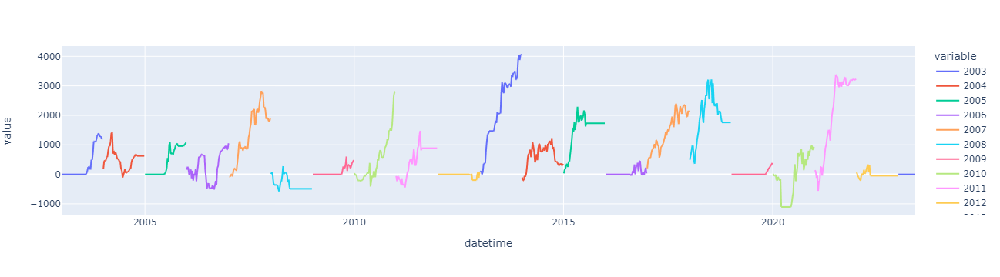

In [47]:
px.line(tqtall,x = 'datetime' ,y = ys)

# 整理夏普買賣訊01值

6.030438675022381
0.0
21.0


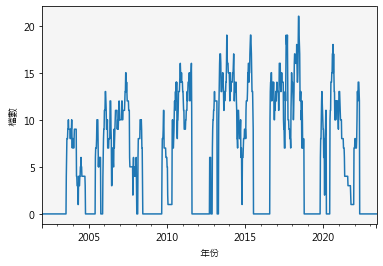

In [48]:
夏普1 = pzmsp.sort_index()
f2 = lambda x :float(x)
夏普2 = 夏普1.applymap(f2)
夏普3 = 夏普2.sum(axis=1)
夏普部位 =夏普3.groupby(pd.Grouper(freq='1W')).tail(1)
print(夏普部位.mean())
print(夏普部位.min())
print(夏普部位.max())
夏普部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('空方部位變化表.png')

# M夏普當週買進部位

In [49]:
M夏普持有部位 = 夏普2.loc[當週日期][夏普2.loc[當週日期] ==1]
M夏普買進 = 夏普2.loc[當週日期][(夏普2.loc[當週日期] ==1) & (夏普2.loc[前週日期] ==0)]
M夏普賣出 = 夏普2.loc[當週日期][(夏普2.loc[當週日期] ==0) & (夏普2.loc[前週日期] ==1)]
print("M夏普買進標的")
print(M夏普買進)
print("M夏普買進檔數" , len(M夏普買進))
print("M夏普持有部位數目" , len(M夏普持有部位))
print("M夏普賣出部位")
print(M夏普賣出)
print("M夏普賣出檔數" , len(M夏普賣出))

M夏普買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
M夏普買進檔數 0
M夏普持有部位數目 0
M夏普賣出部位
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
M夏普賣出檔數 0


# 夏普歷年損益

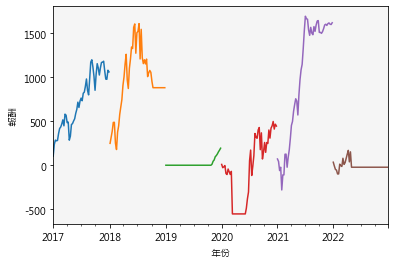

In [50]:
yl = ['2017','2018','2019','2020','2021','2022']
for h in yl :
    trrtms = trrmsharpe.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtmsfig = (trrtms*3).plot()
trrtmsfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtmsfig.savefig('M夏普歷年損益.png')

# 量能突破策略

100%|██████████| 1098/1098 [05:34<00:00,  3.28it/s]


Text(0, 0.5, 'Profit')

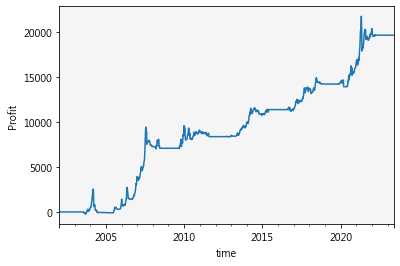

In [51]:
import talib
ERROR = []
trrv = pd.DataFrame()
pvz = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['SMAX52'] = DDW[str(x)]["還原收盤價"].rolling(4).max()
    DDW[str(x)]["SMAX52S"] = DDW[str(x)]["MAX52"].shift(1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    VBS = 0
    VBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["成交金額(千)"].iloc[z]  > (DDW[str(x)]["成交金額(千)"].shift(1)*1.5).iloc[z] and DDW[str(x)]["成交金額(千)"].iloc[z] > 100000 \
        and DDW[str(x)]["收盤價"].iloc[z]  > (DDW[str(x)]["最高價"].shift(2)*1.1).iloc[z] and DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]["SMAX52S"].iloc[z] \
        and DDW[str(x)]['大盤夏普'].iloc[z] > 0.3:
        
            VBS = 1

        elif  DDW[str(x)]["收盤價"].iloc[z] < DDW[str(x)]["最低價"].shift(2).iloc[z] or DDW[str(x)]['大盤夏普'].iloc[z]  < 0.3 :
            VBS = 0
            #buy.append("0")
        VBUY.append(VBS)
    DDW[str(x)]["VBUY"] = VBUY
    DDW[str(x)]["VBUYS"] = DDW[str(x)]["VBUY"].shift(1)
    pzb = DDW[str(x)]["VBUYS"]  
    pzb.name = str(x)
    pvzbs = DDW[str(x)]["VBUY"]
    pvzbs.name = str(x)
    DDW[str(x)]["RR"] = DDW[str(x)]["DR"] * DDW[str(x)]["VBUYS"].dropna().astype(int)
    PVT = DDW[str(x)]["RR"]
    PVT.name = str(x)
    if len(trr) == 0:
        trrv = PVT
    else:
        trrv = pd.merge(trrv,PVT,left_on = trrv.index,right_on = PVT.index,how = 'outer')
        trrv.set_index('key_0',inplace = True)
    if len(pz) == 0:
        pvz = pvzbs
    else:
        pvz = pd.merge(pvz,pvzbs,left_on = pvz.index,right_on = pvzbs.index,how = 'outer')
        pvz.set_index('key_0',inplace = True)

trrv1 =trrv.sort_index().sum(axis = 1).cumsum().plot()

plt.xlabel("time")
plt.ylabel("Profit")

# 整理量能買賣訊01值

34.515666965085046
0.0
264.0


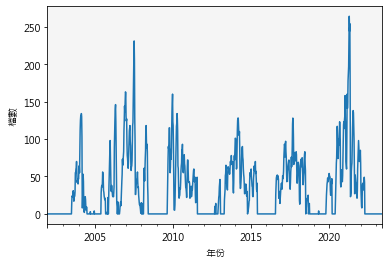

In [52]:
pvz1 = pvz.sort_index()
f4 = lambda x :float(x)
pvz2 = pvz1.applymap(f4)
pvz3 = pvz2.sum(axis=1)
pvz4 = pvz3.groupby(pd.Grouper(freq='1W')).tail(1)
print(pvz4.mean())
print(pvz4.min())
print(pvz4.max())
pvz4.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

# <font color="red">量能當週買進部位</font>

In [53]:
#當週日期 = '2022-08-26'
#前週日期 = '2022-08-19'

量能持有部位 = pvz2.loc[當週日期][pvz2.loc[當週日期] ==1]
量能買進 = pvz2.loc[當週日期][(pvz2.loc[當週日期] ==1) & (pvz2.loc[前週日期] ==0)]
量能賣出 = pvz2.loc[當週日期][(pvz2.loc[當週日期] ==0) & (pvz2.loc[前週日期] ==1)]
print("量能買進標的")
print(量能買進)
print("量能買進檔數" , len(量能買進))
print("量能持有部位數目" , len(量能持有部位))
print("量能賣出部位")
print(量能賣出)
print("量能賣出檔數" , len(量能賣出))

量能買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
量能買進檔數 0
量能持有部位數目 0
量能賣出部位
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
量能賣出檔數 0


# 低接策略

100%|██████████| 1098/1098 [06:31<00:00,  2.81it/s]


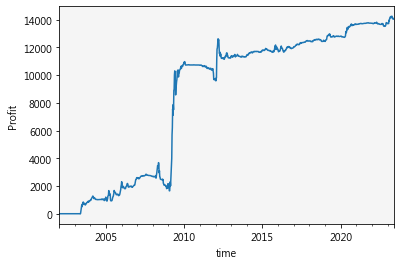

In [54]:
import talib
ERROR = []
trrkd = pd.DataFrame()
pzkd1 = pd.DataFrame()

for x in tqdm(SKTCRI):
    DDW[str(x)]["K"],DDW[str(x)]["D"] = talib.STOCH(DDW[str(x)]['最高價'], 
                              DDW[str(x)]['最低價'], 
                              DDW[str(x)]['收盤價'], 
                              fastk_period=52,
                              slowk_period=10,
                              slowk_matype=1,
                              slowd_period=10,
                              slowd_matype=1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    KDBS = 0
    KDBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["K"].iloc[z] > DDW[str(x)]["D"].iloc[z] and DDW[str(x)]["K"].shift(1).iloc[z] < DDW[str(x)]["D"].shift(1).iloc[z] \
        and DDW[str(x)]['成交金額(千)'].iloc[z] < 500000 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 150 \
        and DDW[str(x)]['D'].iloc[z] < 20 and DDW[str(x)]['還原收盤價'].iloc[z] < (DDW[str(x)]['MAX52S']*0.7).iloc[z] :
        
            KDBS = 1

        elif  DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(4).min().shift(1).iloc[z] :
            KDBS = 0
            #buy.append("0")
        KDBUY.append(KDBS)
    DDW[str(x)]["KDBUY"] = KDBUY
    DDW[str(x)]["KDBUYS"] = DDW[str(x)]["KDBUY"].shift(1)
    pzkd = DDW[str(x)]["KDBUYS"]  
    pzkd.name = str(x)
    pzkds = DDW[str(x)]["KDBUY"]
    pzkds.name = str(x)
    DDW[str(x)]["KDRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["KDBUYS"].dropna().astype(int)
    PVKD= DDW[str(x)]["KDRR"]
    PVKD.name = str(x)
    if len(trrkd) == 0:
        trrkd = PVKD
    else:
        trrkd = pd.merge(trrkd,PVKD,left_on = trrkd.index,right_on = PVKD.index,how = 'outer')
        trrkd.set_index('key_0',inplace = True)
    if len(pzkd) == 0:
        pzkd1 = pzkds
    else:
        pzkd1 = pd.merge(pzkd1,pzkds,left_on = pzkd1.index,right_on = pzkds.index,how = 'outer')
        pzkd1.set_index('key_0',inplace = True)

trrkd1 =trrkd.sort_index().sum(axis = 1).cumsum().plot()

plt.xlabel("time")
plt.ylabel("Profit")
plt.savefig('低接損益')

# 整理低接買賣訊01值

18.50223813786929
0.0
181.0


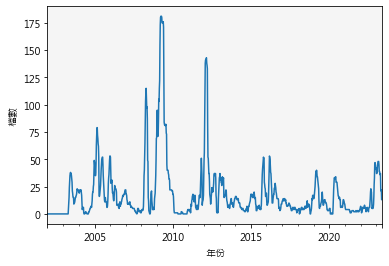

In [55]:
KD1 = pzkd1.sort_index()
f6 = lambda x :float(x)
KD2 = KD1.applymap(f6)
KD3 = KD2.sum(axis=1)
KD部位 =KD3.groupby(pd.Grouper(freq='1W')).tail(1)
print(KD部位.mean())
print(KD部位.min())
print(KD部位.max())
KD部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('低接部位變化表.png')

# 低接當週買進部位

In [56]:

低接持有部位 = KD2.loc[當週日期][KD2.loc[當週日期] ==1]
低接買進 = KD2.loc[當週日期][(KD2.loc[當週日期] ==1) & (KD2.loc[前週日期] ==0)]
低接賣出 = KD2.loc[當週日期][(KD2.loc[當週日期] ==0) & (KD2.loc[前週日期] ==1)]
print("低接買進標的")
print(低接買進)
print("低接買進檔數" , len(低接買進))
print("低接持有部位數目" , len(低接持有部位))
print("低接賣出部位")
print(低接賣出)
print("低接賣出檔數" , len(低接賣出))

低接買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
低接買進檔數 0
低接持有部位數目 14
低接賣出部位
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
低接賣出檔數 0


# 融資爆發策略


In [57]:
import talib
ERROR = []
trrmm = pd.DataFrame()
pzmm = pd.DataFrame()
pzmm1 = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    MMBS = 0
    MMBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['融資維持率(%)'].iloc[z] > 170 and DDW[str(x)]['融資維持率(%)'].shift(1).iloc[z] < 170  \
        and  DDW[str(x)]['成交金額(千)'].iloc[z] < 250000 and DDW[str(x)]['K'].iloc[z] > 50 and DDW[str(x)]['資使用率'].iloc[z] < 15 and  DDW[str(x)]['成交金額(千)'].iloc[z] > 10000 \
        and  DDW[str(x)]['大盤夏普'].iloc[z] < 1.5 :
            MMBS = 1

        elif    (DDW[str(x)]['融資維持率(%)'].shift(1).iloc[z] < 160) or \
         (DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['4MA'].iloc[z] ):
            MMBS = 0
            #buy.append("0")
        MMBUY.append(MMBS)
    DDW[str(x)]["MMBUY"] = MMBUY
    DDW[str(x)]["MMBUYS"] = DDW[str(x)]["MMBUY"].shift(1)
    pzmm = DDW[str(x)]["MMBUYS"]  
    pzmm.name = str(x)
    pzmms = DDW[str(x)]["MMBUY"]
    pzmms.name = str(x)
    DDW[str(x)]["MMRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["MMBUYS"].dropna().astype(int)
    PVMM= DDW[str(x)]["MMRR"]
    PVMM.name = str(x)
    if len(trrmm) == 0:
        trrmm = PVMM
    else:
        trrmm = pd.merge(trrmm,PVMM,left_on = trrmm.index,right_on = PVMM.index,how = 'outer')
        trrmm.set_index('key_0',inplace = True)
    if len(pzmm) == 0:
        pzmm1 = pzmms
    else:
        pzmm1 = pd.merge(pzmm1,pzmms,left_on = pzmm1.index,right_on = pzmms.index,how = 'outer')
        pzmm1.set_index('key_0',inplace = True)

#trrmm1 =trrmm.sort_index().sum(axis = 1).cumsum().plot()

#plt.xlabel("time")
#plt.ylabel("Profit")


100%|██████████| 1098/1098 [04:42<00:00,  3.89it/s]


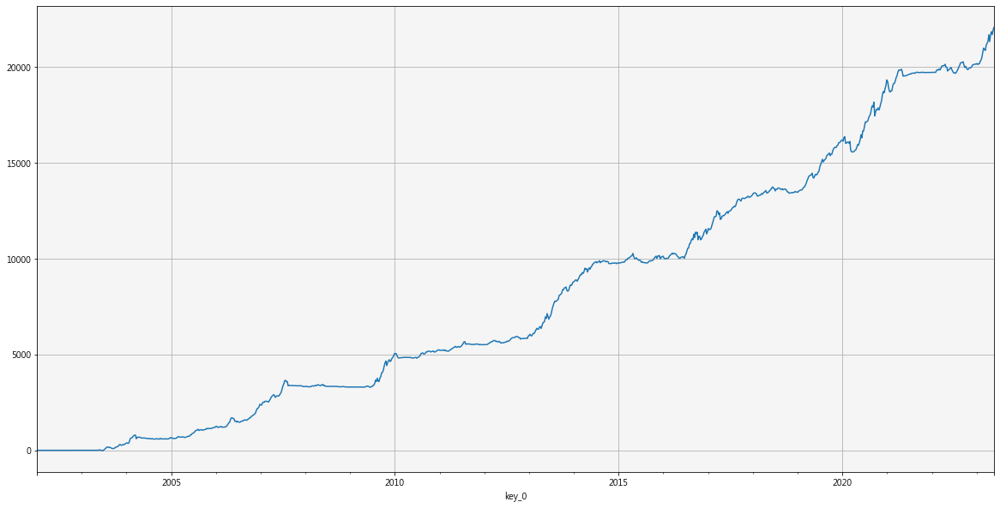

In [58]:
trrmm1 =trrmm.sort_index().sum(axis = 1).cumsum().plot(figsize=(20,10),grid = True)

Text(0, 0.5, '報酬')

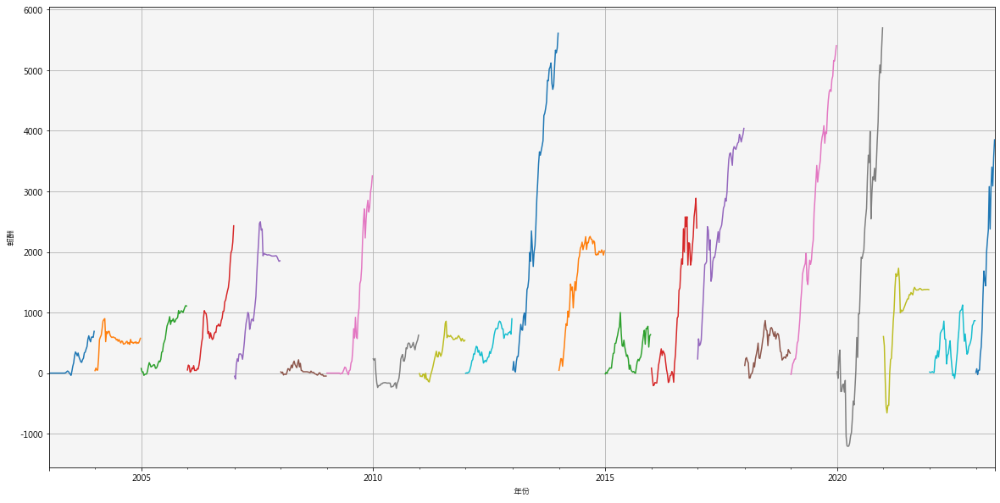

In [59]:
ymm = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in ymm :
    trrmmy = trrmm.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmmy1 = (trrmmy*2).plot(figsize = (20,10),grid = True)


plt.xlabel("年份")
plt.ylabel("報酬")


# 查詢式融資損益

In [60]:
ymm = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
trrmall = pd.Series()
for h in ymm :
    trrmmy = trrmm.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmall = pd.concat([trrmall,trrmmy*2])
trrmall = pd.DataFrame(trrmall)

In [61]:
trrmall = trrmall.reset_index(drop = False)
trrmall = trrmall.rename(columns = {'index':'datetime',0:'returns'})

In [62]:
trrmall['2003'] = np.where(trrmall.datetime<'2004-01-01',trrmall['returns'],np.nan)
trrmall['2004'] = np.where(((trrmall.datetime<'2005-01-01') & (trrmall.datetime>='2004-01-01')),trrmall['returns'],np.nan)
trrmall['2005'] = np.where(((trrmall.datetime<'2006-01-01') & (trrmall.datetime>='2005-01-01')),trrmall['returns'],np.nan)
trrmall['2006'] = np.where(((trrmall.datetime<'2007-01-01') & (trrmall.datetime>='2006-01-01')),trrmall['returns'],np.nan)
trrmall['2007'] = np.where(((trrmall.datetime<'2008-01-01') & (trrmall.datetime>='2007-01-01')),trrmall['returns'],np.nan)
trrmall['2008'] = np.where(((trrmall.datetime<'2009-01-01') & (trrmall.datetime>='2008-01-01')),trrmall['returns'],np.nan)
trrmall['2009'] = np.where(((trrmall.datetime<'2010-01-01') & (trrmall.datetime>='2009-01-01')),trrmall['returns'],np.nan)
trrmall['2010'] = np.where(((trrmall.datetime<'2011-01-01') & (trrmall.datetime>='2010-01-01')),trrmall['returns'],np.nan)
trrmall['2011'] = np.where(((trrmall.datetime<'2012-01-01') & (trrmall.datetime>='2011-01-01')),trrmall['returns'],np.nan)
trrmall['2012'] = np.where(((trrmall.datetime<'2013-01-01') & (trrmall.datetime>='2012-01-01')),trrmall['returns'],np.nan)
trrmall['2013'] = np.where(((trrmall.datetime<'2014-01-01') & (trrmall.datetime>='2013-01-01')),trrmall['returns'],np.nan)
trrmall['2014'] = np.where(((trrmall.datetime<'2015-01-01') & (trrmall.datetime>='2014-01-01')),trrmall['returns'],np.nan)
trrmall['2015'] = np.where(((trrmall.datetime<'2016-01-01') & (trrmall.datetime>='2015-01-01')),trrmall['returns'],np.nan)
trrmall['2016'] = np.where(((trrmall.datetime<'2017-01-01') & (trrmall.datetime>='2016-01-01')),trrmall['returns'],np.nan)
trrmall['2017'] = np.where(((trrmall.datetime<'2018-01-01') & (trrmall.datetime>='2017-01-01')),trrmall['returns'],np.nan)
trrmall['2018'] = np.where(((trrmall.datetime<'2019-01-01') & (trrmall.datetime>='2018-01-01')),trrmall['returns'],np.nan)
trrmall['2019'] = np.where(((trrmall.datetime<'2020-01-01') & (trrmall.datetime>='2019-01-01')),trrmall['returns'],np.nan)
trrmall['2020'] = np.where(((trrmall.datetime<'2021-01-01') & (trrmall.datetime>='2020-01-01')),trrmall['returns'],np.nan)
trrmall['2021'] = np.where(((trrmall.datetime<'2022-01-01') & (trrmall.datetime>='2021-01-01')),trrmall['returns'],np.nan)
trrmall['2022'] = np.where(((trrmall.datetime<'2023-01-01') & (trrmall.datetime>='2022-01-01')),trrmall['returns'],np.nan)
trrmall['2023'] = np.where(((trrmall.datetime<'2024-01-01') & (trrmall.datetime>='2023-01-01')),trrmall['returns'],np.nan)

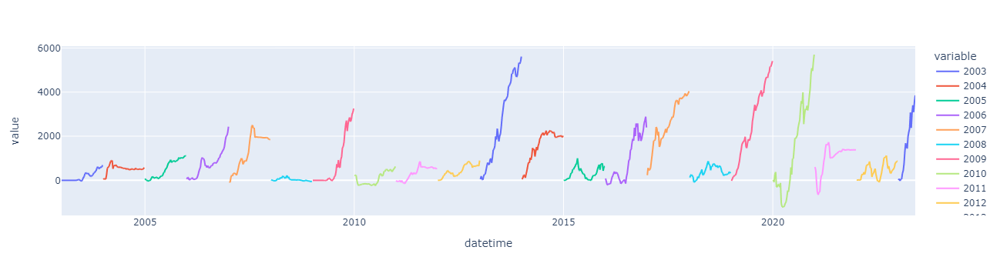

In [63]:
px.line(trrmall, x = 'datetime', y= ymm)

# 整理融資爆發買賣訊01值

34.49328558639212
0.0
155.0


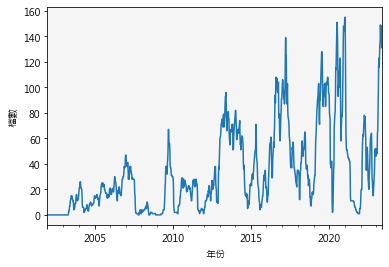

In [64]:
MM1 = pzmm1.sort_index()
f12 = lambda x :float(x)
MM2 = MM1.applymap(f12)
MM3 = MM2.sum(axis=1)
MM部位 =MM3.groupby(pd.Grouper(freq='1W')).tail(1)
print(MM部位.mean())
print(MM部位.min())
print(MM部位.max())
MM部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

# 融資爆發當週買進部位

In [65]:
MM持有部位 = MM2.loc[當週日期][(MM2.loc[當週日期]==1)]
MM買進 = MM2.loc[當週日期][(MM2.loc[當週日期]==1) & (MM2.loc[前週日期]==0)]
MM賣出 = MM2.loc[當週日期][(MM2.loc[當週日期]==0) & (MM2.loc[前週日期]==1)]
print("MM買進標的")
print(MM買進)
print("MM買進檔數" , len(MM買進))
print("MM持有部位數目" , len(MM持有部位))
print("MM賣出部位")
print(MM賣出)
print("MM賣出檔數" , len(MM賣出))

MM買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
MM買進檔數 0
MM持有部位數目 136
MM賣出部位
1104    0.0
1108    0.0
1786    0.0
4572    0.0
Name: 2023-05-26 00:00:00, dtype: float64
MM賣出檔數 4


# X策略

100%|██████████| 1098/1098 [05:13<00:00,  3.50it/s]


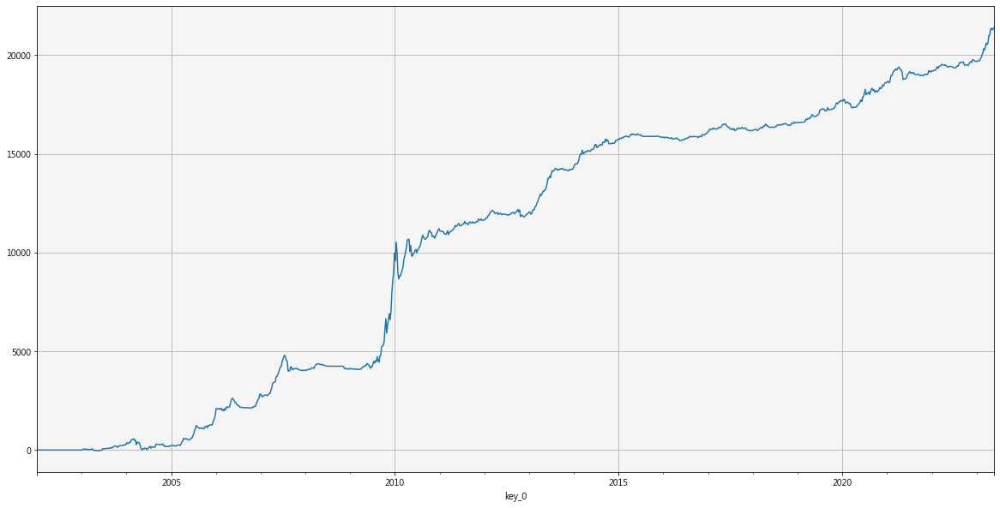

In [66]:
import talib
ERROR = []
trrmmstop = pd.DataFrame()
pzmmstop = pd.DataFrame()
pzmm1stop = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MA"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    MMBSstop = 0
    MMBUYstop =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['融資維持率(%)'].iloc[z] == 0 and DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["MAX52S"].iloc[z] and DDW[str(x)]['資使用率'].iloc[z] == 0 \
        and DDW[str(x)]['收盤價'].iloc[z] > 10 and  DDW[str(x)]['成交金額(千)'].iloc[z] < 100000 and DDW[str(x)]['成交金額(千)'].iloc[z] > 20000 :
        
        
            MMBSstop = 1

        elif DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['4MA'].iloc[z] :
            MMBSstop = 0
            #buy.append("0")
        MMBUYstop.append(MMBSstop)
    DDW[str(x)]["MMBUYSTOP"] = MMBUYstop
    DDW[str(x)]["MMBUYSSTOP"] = DDW[str(x)]["MMBUYSTOP"].shift(1)
    pzmmstop = DDW[str(x)]["MMBUYSSTOP"]  
    pzmmstop.name = str(x)
    pzmmsstop = DDW[str(x)]["MMBUYSTOP"]
    pzmmsstop.name = str(x)
    DDW[str(x)]["MMRRSTOP"] = DDW[str(x)]["DR"] * DDW[str(x)]["MMBUYSSTOP"].dropna().astype(int)
    PVMMstop= DDW[str(x)]["MMRRSTOP"]
    PVMMstop.name = str(x)
    if len(trrmmstop) == 0:
        trrmmstop = PVMMstop
    else:
        trrmmstop = pd.merge(trrmmstop,PVMMstop,left_on = trrmmstop.index,right_on = PVMMstop.index,how = 'outer')
        trrmmstop.set_index('key_0',inplace = True)
    if len(pzmmstop) == 0:
        pzmm1stop = pzmmsstop
    else:
        pzmm1stop = pd.merge(pzmm1stop,pzmmsstop,left_on = pzmm1stop.index,right_on = pzmmsstop.index,how = 'outer')
        pzmm1stop.set_index('key_0',inplace = True)
trrmm1stop =(trrmmstop*3).sort_index().sum(axis = 1).cumsum().plot(figsize=(20,10),grid = True)

Text(0, 0.5, '報酬')

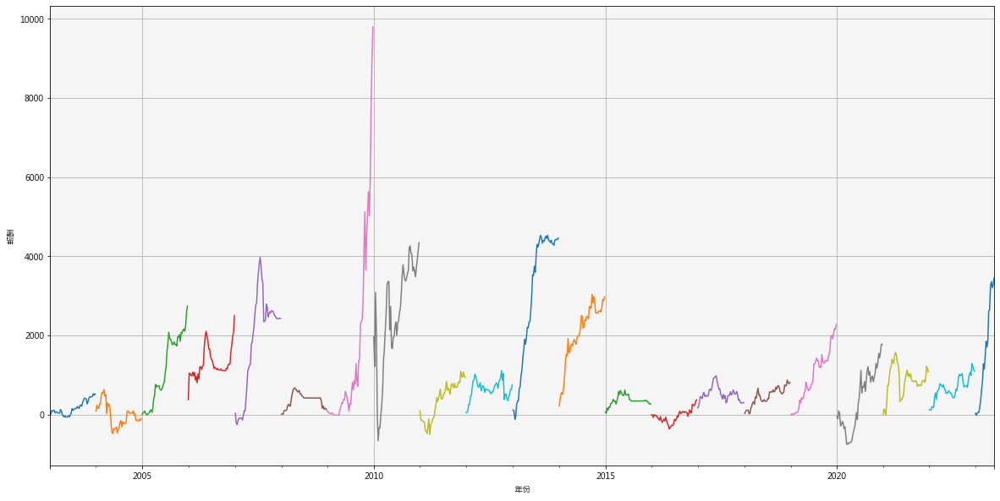

In [67]:
ymmstop = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in ymmstop :
    trrmmystop = (trrmmstop*3).groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmmy1stop = (trrmmystop*2).plot(figsize = (20,10),grid = True)


plt.xlabel("年份")
plt.ylabel("報酬")

7.090420769919427
0.0
55.0


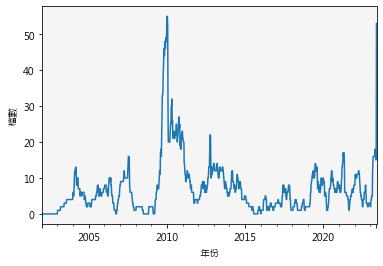

In [68]:
MM1stop = pzmm1stop.sort_index()
f12stop = lambda x :float(x)
MM2stop = MM1stop.applymap(f12stop)
MM3stop = MM2stop.sum(axis=1)
MMstop部位 =MM3stop.groupby(pd.Grouper(freq='1W')).tail(1)
print(MMstop部位.mean())
print(MMstop部位.min())
print(MMstop部位.max())
MMstop部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

In [69]:
MMstop持有部位 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==1)]
MMstop買進 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==1) & (MM2stop.loc[前週日期]==0)]
MMstop賣出 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==0) & (MM2stop.loc[前週日期]==1)]
print("MMstop買進標的")
print(MMstop買進)
print("MMstop買進檔數" , len(MMstop買進))
print("MMstop持有部位數目" , len(MMstop持有部位))
print("MMstop賣出部位")
print(MMstop賣出)
print("MMstop賣出檔數" , len(MMstop賣出))


MMstop買進標的
1307    1.0
1604    1.0
1731    1.0
2115    1.0
2420    1.0
2423    1.0
2467    1.0
2493    1.0
2536    1.0
2640    1.0
2901    1.0
3028    1.0
3052    1.0
3206    1.0
3257    1.0
4417    1.0
4506    1.0
4533    1.0
4706    1.0
6126    1.0
6189    1.0
6486    1.0
6558    1.0
6577    1.0
6803    1.0
8074    1.0
8240    1.0
8463    1.0
8930    1.0
8942    1.0
9911    1.0
9927    1.0
9930    1.0
9944    1.0
9951    1.0
Name: 2023-05-26 00:00:00, dtype: float64
MMstop買進檔數 35
MMstop持有部位數目 53
MMstop賣出部位
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
MMstop賣出檔數 0


In [70]:
MMstop持有部位

1307    1.0
1604    1.0
1731    1.0
2115    1.0
2420    1.0
2423    1.0
2467    1.0
2493    1.0
2536    1.0
2640    1.0
2755    1.0
2901    1.0
3028    1.0
3052    1.0
3130    1.0
3206    1.0
3257    1.0
3570    1.0
4160    1.0
4417    1.0
4506    1.0
4533    1.0
4706    1.0
4754    1.0
4767    1.0
5209    1.0
6126    1.0
6189    1.0
6486    1.0
6558    1.0
6569    1.0
6574    1.0
6577    1.0
6590    1.0
6680    1.0
6690    1.0
6697    1.0
6703    1.0
6751    1.0
6752    1.0
6803    1.0
8074    1.0
8240    1.0
8279    1.0
8416    1.0
8463    1.0
8930    1.0
8942    1.0
9911    1.0
9927    1.0
9930    1.0
9944    1.0
9951    1.0
Name: 2023-05-26 00:00:00, dtype: float64

In [71]:
DDW['2755'].tail(10)

,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR,SELLETF,SELLSETF,SRRETF,rolling_ret,rolling_std,sharpe105,sharp1,BUYQT,BUYQTS,QTRR,SMAX52,SMAX52S,VBUY,VBUYS,RR,K,D,KDBUY,KDBUYS,KDRR,MMBUY,MMBUYS,MMRR,MMBUYSTOP,MMBUYSSTOP,MMRRSTOP
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-03-24,136.5,148.5,134.0,146.0,62620.0,0.0,0.0,146.0,0.18,80.13,0.14,131.88,5.84,F,146.0,137.0,114.74,114.74,6.569343,-0.316062,-0.316062,1,1.0,6.569343,137.0,148.5,125.0,130.000,115.500000,93.315,120.625,93.315,93.315,0,0.0,0.0,0,0.0,0.0,0.021400,0.045184,0.473610,0.311827,0,0.0,0.0,146.0,137.0,0,0.0,0.0,92.565256,86.486970,0,0.0,0.0,0,0.0,0.0,1,1.0,6.569343
2023-03-31,152.0,160.5,137.5,139.5,126790.0,0.0,0.0,139.5,0.18,80.13,0.34,142.16,5.58,F,146.0,146.0,125.70,125.70,-4.452055,-0.427550,-0.427550,1,1.0,-4.452055,139.5,160.5,137.0,136.875,122.742857,96.465,130.000,96.465,96.465,0,0.0,-0.0,0,0.0,-0.0,0.020208,0.046098,0.438359,0.307410,0,0.0,-0.0,146.0,146.0,0,0.0,-0.0,90.227963,87.167151,0,0.0,-0.0,0,0.0,-0.0,1,1.0,-4.452055
2023-04-07,140.0,143.0,137.5,140.0,22071.0,0.0,0.0,140.0,0.18,80.13,0.48,141.46,5.60,F,146.0,146.0,131.90,131.90,0.358423,-0.488749,-0.488749,1,1.0,0.358423,139.5,160.5,139.5,140.625,129.714286,99.755,136.875,99.755,99.755,0,0.0,0.0,0,0.0,0.0,0.020673,0.045799,0.451395,0.305885,0,0.0,0.0,146.0,146.0,0,0.0,0.0,88.403468,87.391936,0,0.0,0.0,0,0.0,0.0,1,1.0,0.358423
2023-04-14,142.5,153.5,141.5,152.5,75268.0,0.0,0.0,152.5,0.18,80.13,0.55,144.80,6.10,F,152.5,146.0,137.50,137.50,8.928571,-0.461690,-0.461690,1,1.0,8.928571,140.0,153.5,139.5,144.500,136.000000,103.480,140.625,103.480,103.480,0,0.0,0.0,0,0.0,0.0,0.022220,0.046741,0.475391,0.329316,0,0.0,0.0,152.5,146.0,0,0.0,0.0,89.101118,87.702696,0,0.0,0.0,0,0.0,0.0,1,1.0,8.928571
2023-04-21,155.0,155.5,146.5,148.0,134691.0,0.0,0.0,148.0,0.18,80.13,0.68,148.14,5.92,F,152.5,152.5,143.00,143.00,-2.950820,-0.436927,-0.436927,1,1.0,-2.950820,148.0,155.5,140.0,145.000,141.142857,106.950,144.500,106.950,106.950,0,0.0,-0.0,0,0.0,-0.0,0.021386,0.047276,0.452361,0.318982,0,0.0,-0.0,152.5,152.5,0,0.0,-0.0,88.878342,87.916450,0,0.0,-0.0,0,0.0,-0.0,1,1.0,-2.950820
2023-04-28,148.5,151.5,142.5,147.5,38887.0,0.0,0.0,147.5,0.18,80.13,0.72,147.95,5.90,F,152.5,152.5,145.20,145.20,-0.337838,-0.362288,-0.362288,1,1.0,-0.337838,147.5,155.5,148.0,147.000,144.357143,110.145,145.000,110.145,110.145,0,0.0,-0.0,0,0.0,-0.0,0.021058,0.047390,0.444360,0.356523,0,0.0,-0.0,152.5,152.5,0,0.0,-0.0,88.583171,88.037672,0,0.0,-0.0,0,0.0,-0.0,1,1.0,-0.337838
2023-05-05,147.5,153.5,145.0,151.0,32144.0,0.0,0.0,151.0,0.18,80.13,1.13,148.39,6.04,F,152.5,152.5,145.50,145.50,2.372881,-0.385295,-0.385295,1,1.0,2.372881,147.5,153.5,147.5,149.750,146.357143,113.590,147.000,113.590,113.590,0,0.0,0.0,0,0.0,0.0,0.021189,0.047388,0.447151,0.362860,0,0.0,0.0,152.5,152.5,0,0.0,0.0,88.948787,88.203329,0,0.0,0.0,0,0.0,0.0,1,1.0,2.372881
2023-05-12,149.0,156.0,138.5,142.5,61439.0,0.0,0.0,142.5,0.18,80.13,0.71,148.17,5.70,F,152.5,152.5,147.80,147.80,-5.629139,-0.210928,-0.210928,1,1.0,-5.629139,142.5,156.0,147.5,147.250,145.857143,116.660,149.750,116.660,116.660,0,0.0,-0.0,0,0.0,-0.0,0.019662,0.048589,0.404653,0.372952,0,0.0,-0.0,151.0,152.5,0,0.0,-0.0,87.717774,88.115046,0,0.0,-0.0,0,0.0,-0.0,1,1.0,-5.629139
2023-05-19,140.5,148.5,140.0,142.5,31823.0,0.0,0.0,142.5,0.05,80.13,0.70,147.69,1.43,F,152.5,152.5,148.30,148.30,0.000000,0.018122,0.018122,1,1.0,0.000000,142.5,156.0,142.5,145.875,146.285714,119.680,147.250,119.680,119.680,0,0.0,0.0,0,0.0,0.0,0.019725,0.048560,0.406190,0.368864,0,0.0,0.0,151.0,152.5,0,0.0,0.0,86.678179,87.853798,0,0.0,0.0,0,0.0,0.0,1,1.0,0.000000


# 外資策略

100%|██████████| 1098/1098 [03:20<00:00,  5.46it/s]


Text(0, 0.5, 'Profit')

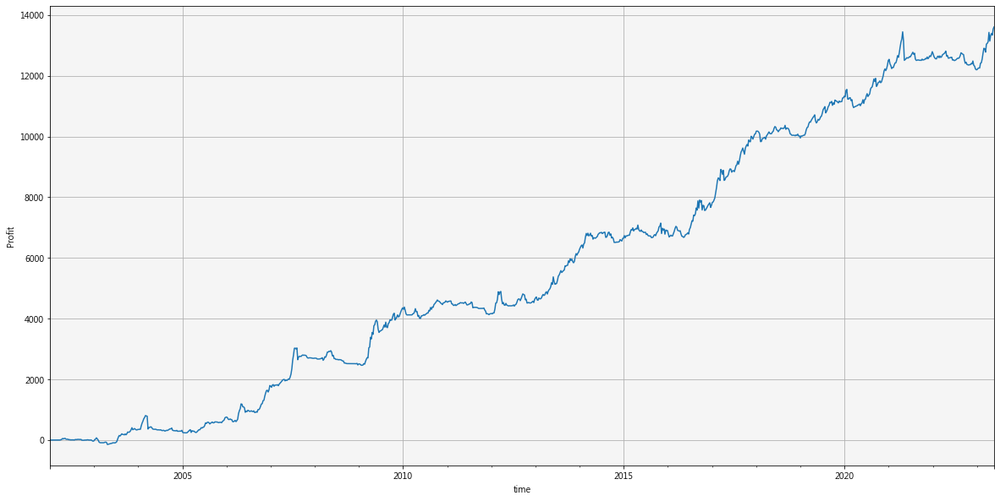

In [72]:
import talib
ERROR = []
trrtest = pd.DataFrame()
pztest = pd.DataFrame()
pztest1 = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["FF4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=10, matype=0)
    DDW[str(x)]["FF4MAS"] = DDW[str(x)]["FF4MA"].shift(1)
    DDW[str(x)]['FFMAX'] = DDW[str(x)]["還原收盤價"].rolling(10).max()
    DDW[str(x)]["FFMAXS"] = DDW[str(x)]["FFMAX"].shift(1)
    DDW[str(x)]["FFMINS"] = DDW[str(x)]["最低價"].rolling(10).min().shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    #DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    TESTBS = 0
    TESTBUY =[]
    for z in range(len(DDW[str(x)])):

        if  DDW[str(x)]['外資持股比率(%)'].iloc[z] > DDW[str(x)]['外資持股比率(%)'].shift(1).iloc[z] and DDW[str(x)]['外資持股比率(%)'].iloc[z] >10 \
        and  DDW[str(x)]['成交金額(千)'].iloc[z] < 700000 and DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['FFMAXS'].iloc[z] and  DDW[str(x)]['成交金額(千)'].iloc[z] > 50000 \
        and DDW[str(x)]['外資持股比率(%)'].iloc[z] > DDW[str(x)]['外資持股比率(%)'].shift(10).iloc[z] :
            TESTBS = 1

        elif DDW[str(x)]['還原收盤價'].iloc[z] < (DDW[str(x)]['FF4MA'].iloc[z]) or DDW[str(x)]['收盤價'].iloc[z] < (DDW[str(x)]['FFMINS'].iloc[z]) \
        or (DDW[str(x)]['外資持股比率(%)'].iloc[z] < DDW[str(x)]['外資持股比率(%)'].shift(5).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['還原收盤價'].shift(3).iloc[z]):
            TESTBS = 0
            #buy.append("0")
        TESTBUY.append(TESTBS)
    DDW[str(x)]["TESTBUY"] = TESTBUY
    DDW[str(x)]["TESTBUYS"] = DDW[str(x)]["TESTBUY"].shift(1)
    pztests = DDW[str(x)]["TESTBUYS"]  
    pztests.name = str(x)
    pztest = DDW[str(x)]["TESTBUY"]
    pztest.name = str(x)
    DDW[str(x)]["TESTRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["TESTBUYS"].dropna().astype(int)
    PVTEST= DDW[str(x)]["TESTRR"]
    PVTEST.name = str(x)
    if len(trrtest) == 0:
        trrtest = PVTEST
    else:
        trrtest = pd.merge(trrtest,PVTEST,left_on = trrtest.index,right_on = PVTEST.index,how = 'outer')
        trrtest.set_index('key_0',inplace = True)
    if len(pztest) == 0:
        pztest1 = pztest
    else:
        pztest1 = pd.merge(pztest1,pztest,left_on = pztest1.index,right_on = pztest.index,how = 'outer')
        pztest1.set_index('key_0',inplace = True)

trrtest1 =trrtest.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

plt.xlabel("time")
plt.ylabel("Profit")


# 整理外資買賣訊01值

30.930170098478065
0.0
131.0


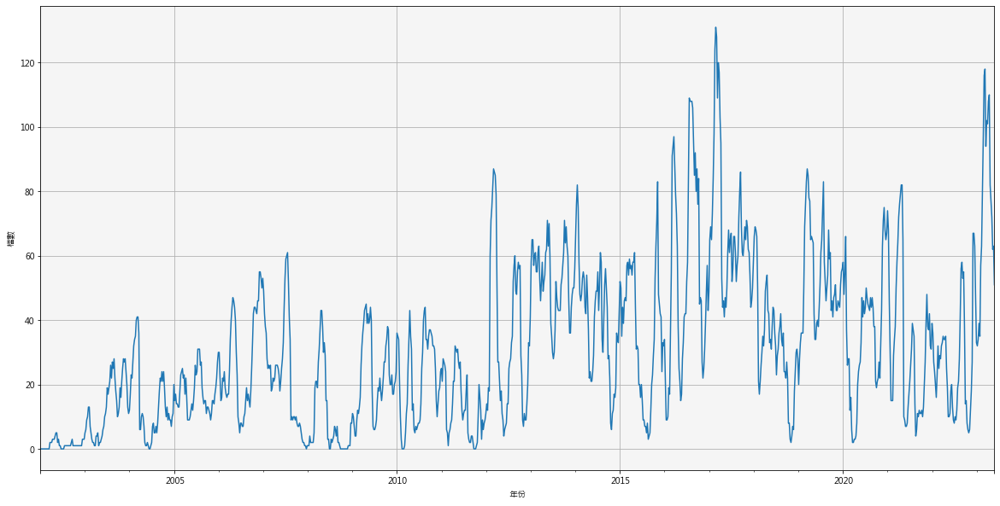

In [73]:
外資1 = pztest1.sort_index()
fsit = lambda x :float(x)
外資2 = 外資1.applymap(fsit)
外資3 = 外資2.sum(axis=1)
外資4 = 外資3.groupby(pd.Grouper(freq='1W')).tail(1)
print(外資4.mean())
print(外資4.min())
print(外資4.max())
外資4.plot(figsize=(20, 10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('外資部位變化表.png')

# 外資當週買進部位

In [74]:
外資持有部位 = 外資2.loc[當週日期][外資2.loc[當週日期] ==1]
外資買進 = 外資2.loc[當週日期][(外資2.loc[當週日期] ==1) & (外資2.loc[前週日期] ==0)]
外資賣出 = 外資2.loc[當週日期][(外資2.loc[當週日期] ==0) & (外資2.loc[前週日期] ==1)]
print("外資買進標的")
print(外資買進)
print("外資買進檔數" , len(外資買進))
print("外資持有部位數目" , len(外資持有部位))
print("外資賣出部位")
print(外資賣出)
print("外資賣出檔數" , len(外資賣出))

外資買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
外資買進檔數 0
外資持有部位數目 51
外資賣出部位
1104    0.0
1215    0.0
2504    0.0
2515    0.0
3218    0.0
3570    0.0
4126    0.0
4137    0.0
4439    0.0
5478    0.0
6234    0.0
6438    0.0
Name: 2023-05-26 00:00:00, dtype: float64
外資賣出檔數 12


Text(0, 0.5, '報酬')

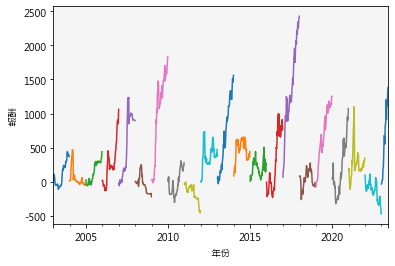

In [75]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrtestw = trrtest.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtestfig = (trrtestw).plot()


plt.xlabel("年份")
plt.ylabel("報酬")


In [76]:
print("外資持有部位數目")
print(list(外資持有部位.index))

外資持有部位數目
['1210', '1229', '1307', '1612', '1702', '1907', '2105', '2206', '2211', '2353', '2393', '2489', '2548', '2633', '2704', '2903', '2916', '3005', '3014', '3015', '3023', '3026', '3038', '3444', '3546', '3548', '3563', '3583', '3705', '4581', '4766', '5225', '5243', '5284', '5289', '5469', '5536', '6176', '6214', '6230', '6414', '6570', '6605', '6703', '6754', '8112', '8163', '8422', '9917', '9925', '9927']


<AxesSubplot:xlabel='日期'>

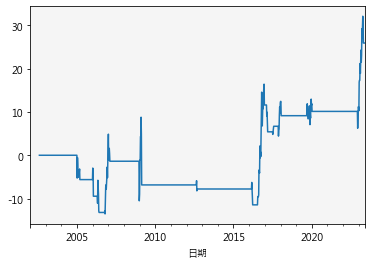

In [77]:
DDW['1304']['TESTRR'].cumsum().plot()

# 所有策略部位變化與配置

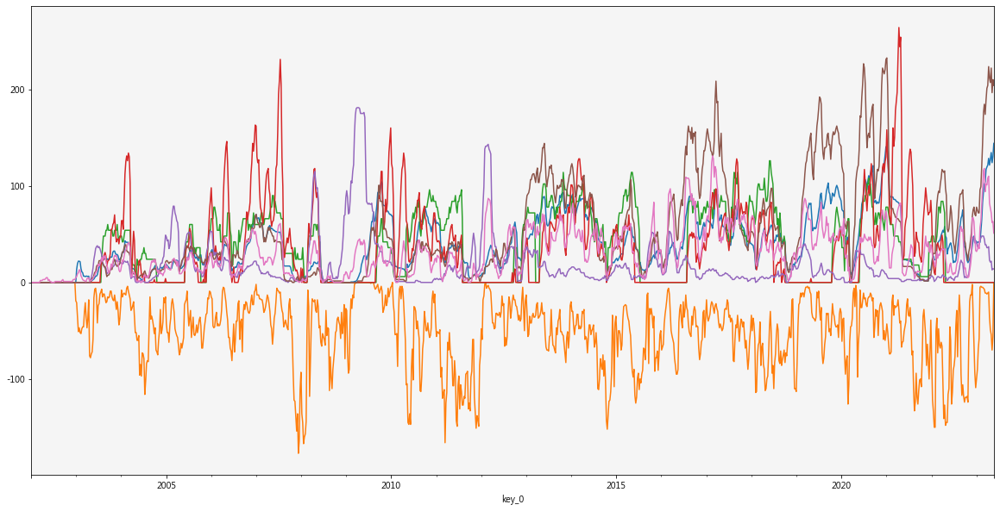

In [117]:
(pz4*0.5).plot(figsize=(20, 10),grid = True)#關鍵點
pzs4.plot()#放空
(夏普部位*6).plot()#強勢夏普
pvz4.plot()#量能
KD部位.plot()#低接
(MM部位*1.5).plot()#融資
外資4.plot()
plt.savefig('所有策略檔數')


<AxesSubplot:xlabel='key_0'>

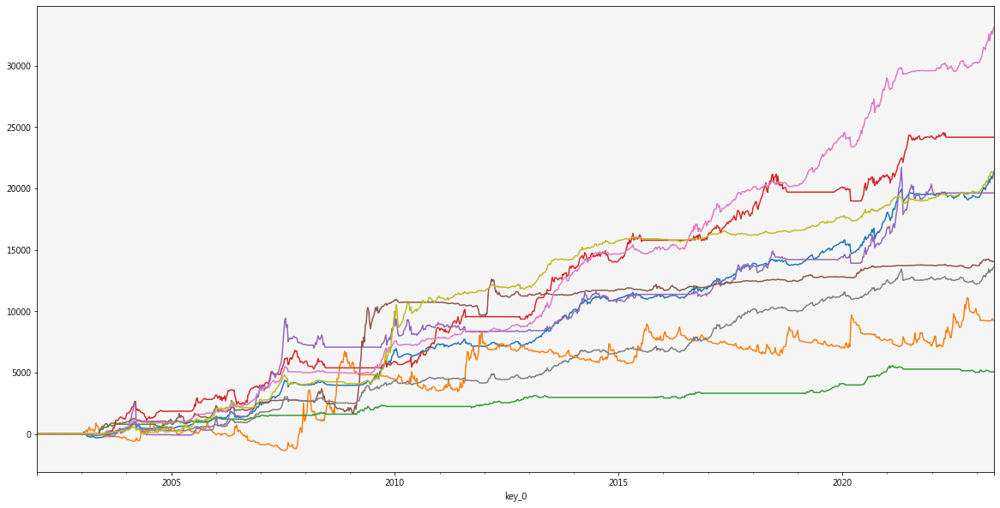

In [144]:
(trr.sort_index().sum(axis = 1).cumsum()*0.5).plot(figsize=(20, 10),grid = True)
trrs.sort_index().sum(axis = 1).cumsum().plot()
(trr2330*20).sort_index().cumsum().plot()
(trrmsharpe.sort_index().sum(axis = 1).cumsum()*6).plot()
trrv.sort_index().sum(axis = 1).cumsum().plot()
trrkd.sort_index().sum(axis = 1).cumsum().plot()
(trrmm.sort_index().sum(axis = 1).cumsum()*1.5).plot()
trrtest.sort_index().sum(axis = 1).cumsum().plot()
(trrmmstop.sort_index().sum(axis = 1).cumsum()*3).plot()

# 淨部位變化

多空總部位 521.0


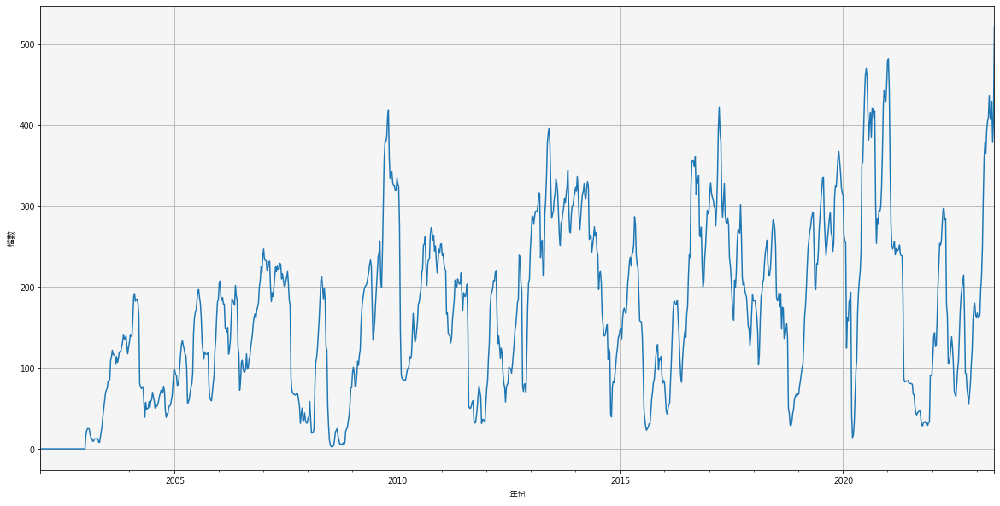

In [145]:
總部位變化 =  pz4*0.5  + (夏普部位*6)  +MM部位*1.5+KD部位 + MMstop部位*3#+ pzs4
總部位變化.plot(figsize=(20, 10),grid = True)
print('多空總部位',總部位變化[當週日期])
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\總部位水位變化')

In [146]:
總部位變化.tail(10)


key_0
2023-03-24    393.0
2023-03-31    404.5
2023-04-07    409.5
2023-04-14    437.0
2023-04-21    410.0
2023-04-28    406.5
2023-05-05    429.5
2023-05-12    378.5
2023-05-19    408.5
2023-05-26    521.0
dtype: float64

In [123]:
總部位變化.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\淨部位變化.xlsx')

# 混合策略損益

<AxesSubplot:xlabel='key_0'>

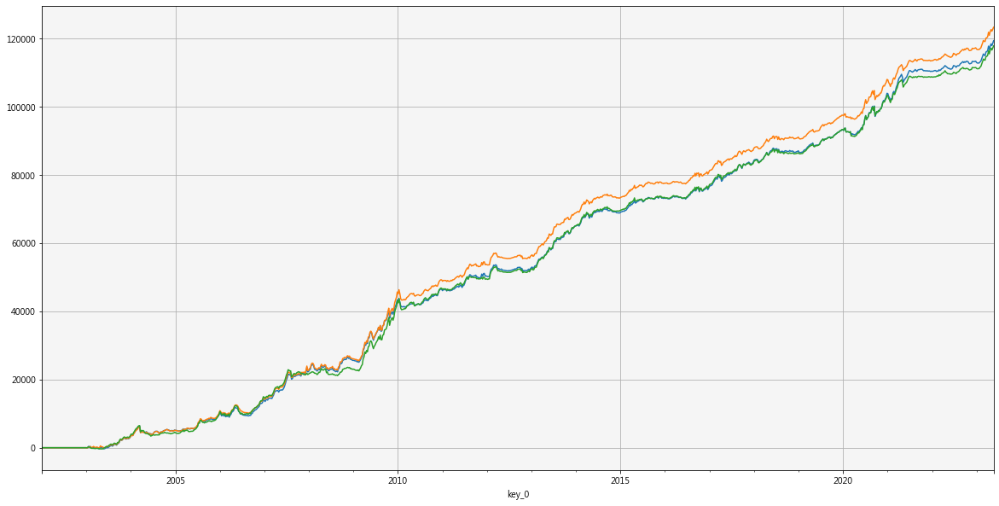

In [147]:
所有策略加總 =  trrsp  + (trr.sort_index().sum(axis = 1).cumsum()) + (trrkd.sort_index().sum(axis = 1).cumsum()) \
 +(trrmm.sort_index().sum(axis = 1).cumsum())+tqt1*6+(trrmmstop.sort_index().sum(axis = 1).cumsum()) #++ trrtest.sort_index().sum(axis = 1).cumsum()+(trr2330*20)+ (trrv.sort_index().sum(axis = 1).cumsum())
所有策略加總.plot(figsize=(20, 10),grid = True)
plt.savefig("所有策略加總")
修正後所有策略加總 =  trrsp  + (trr.sort_index().sum(axis = 1).cumsum())*0.5 + (trrkd.sort_index().sum(axis = 1).cumsum()) \
 +(trrmm.sort_index().sum(axis = 1).cumsum())*1.5+tqt1*6+(trrmmstop.sort_index().sum(axis = 1).cumsum())*3
修正後所有策略加總.plot(figsize=(20, 10),grid = True)
修正後ETF所有策略加總 =  (trrspETF*1)  + (trr.sort_index().sum(axis = 1).cumsum())*0.5 + (trrkd.sort_index().sum(axis = 1).cumsum()) \
 +(trrmm.sort_index().sum(axis = 1).cumsum())*1.5+tqt1*6+(trrmmstop.sort_index().sum(axis = 1).cumsum())*3
修正後ETF所有策略加總.plot(figsize=(20, 10),grid = True)

# 歷年損益

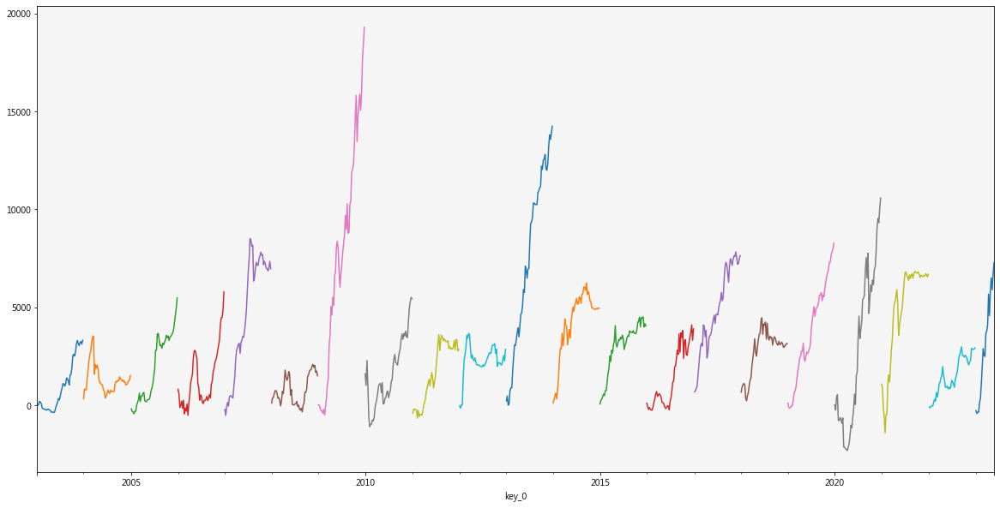

In [149]:
分年加總 = (trr.sort_index().sum(axis = 1))*0.5 + ((trrsETF*1).sort_index().sum(axis = 1)) + (trrmsharpe.sort_index().sum(axis = 1))*6+ (trrkd.sort_index().sum(axis = 1)) +\
 (trrmm.sort_index().sum(axis = 1))*2 +(trrmmstop.sort_index().sum(axis = 1))*3
(分年加總['2003']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2004']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2005']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2006']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2007']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2008']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2009']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2010']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2011']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2012']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2013']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2014']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2015']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2016']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2017']*1).cumsum().plot()
(分年加總['2018']*1).cumsum().plot()
(分年加總['2019']*1).cumsum().plot()
(分年加總['2020']*1).cumsum().plot()
(分年加總['2021']*1).cumsum().plot()
(分年加總['2022']*1).cumsum().plot()
(分年加總['2023']*1).cumsum().plot()



plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\分年損益.png')


# 當年損益(數字)

In [150]:
分年加總['2023':].cumsum()

key_0
2023-01-06    -262.861899
2023-01-13    -400.591080
2023-01-20    -332.844897
2023-01-27    -332.844897
2023-02-03     142.262738
2023-02-10     386.015271
2023-02-17    1150.568055
2023-02-24    2019.463017
2023-03-03    2899.308085
2023-03-10    2555.616515
2023-03-17    2504.262016
2023-03-24    3664.291412
2023-03-31    3806.630249
2023-04-07    4139.012703
2023-04-14    5683.503328
2023-04-21    4583.679383
2023-04-28    5861.898053
2023-05-05    6511.047103
2023-05-12    5900.955994
2023-05-19    6654.012910
2023-05-26    7291.699591
dtype: float64

<AxesSubplot:xlabel='key_0'>

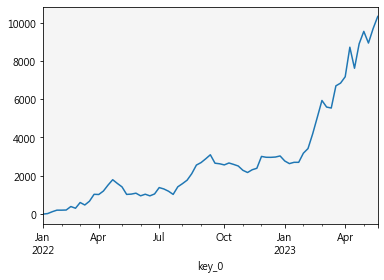

In [127]:
分年加總['2022':].cumsum().plot()

# 前後比較

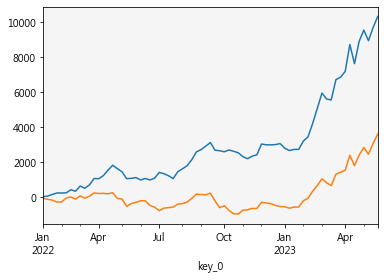

In [128]:
(分年加總['2022':]).cumsum().plot()
(trr['2022':].sort_index().sum(axis = 1).cumsum()).plot()
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\前後比較.png')

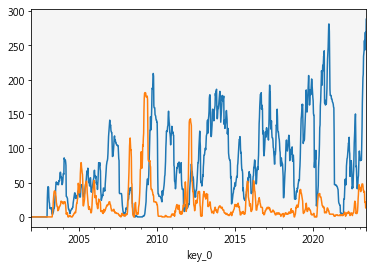

In [88]:
pz4.plot()#關鍵點
#pzs4.plot()
#(夏普部位*6).plot()
#pvz4.plot()
KD部位.plot()
#(MM部位*2).plot()
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\檔數交會.png')


# 當週彙總整理

In [89]:
print("關鍵點買進標的")
print(關鍵點買進)
print("關鍵點買進檔數" , len(關鍵點買進))
print("關鍵點持有部位數目" , len(關鍵點持有部位))
print("關鍵點賣出標的")
print(關鍵點賣出)
print("關鍵點賣出檔數" , len(關鍵點賣出))
print("M夏普買進標的")
print(M夏普買進)
print("M夏普買進檔數" , len(M夏普買進))
print("M夏普持有部位數目" , len(M夏普持有部位))
print("M夏普賣出標的")
print(M夏普賣出)
print("M夏普賣出檔數" , len(M夏普賣出))
print("量能買進標的")
print(量能買進)
print("量能買進檔數" , len(量能買進))
print("量能持有部位數目" , len(量能持有部位))
print("量能賣出標的")
print(量能賣出)
print("量能賣出檔數" , len(量能賣出))
print("低接買進標的")
print(低接買進)
print("低接買進檔數" , len(低接買進))
print("低接持有部位數目" , len(低接持有部位))
print("低接賣出標的")
print(低接賣出)
print("低接賣出檔數" , len(低接賣出))
print("融資爆發買進標的")
print(MM買進)
print("融資爆發買進檔數" , len(MM買進))
print("融資爆發持有部位數目" , len(MM持有部位))
print("融資爆發賣出標的")
print(MM賣出)
print("融資爆發賣出檔數" , len(MM賣出))
print("X買進標的")
print(MMstop買進)
print("X買進檔數" , len(MMstop買進))
print("X持有部位數目" , len(MMstop持有部位))
print("X賣出標的")
print(MMstop賣出)
print("X賣出檔數" , len(MMstop賣出))
print("外資買進標的")
print(外資買進)
print("外資買進檔數" , len(外資買進))
print("外資持有部位數目" , len(外資持有部位))
print("外資賣出標的")
print(外資賣出)
print("外資賣出檔數" , len(外資賣出))
print("空單放空標的")
print(空單放空)
print("空單放空檔數" , len(空單放空))
print("空單持有空單部位數目" , len(空單放空部位))
print("空單回補標的")
print(空單回補)
print("ETF空單放空標的")
print(ETF空單放空)
print("ETF空單放空檔數" , len(ETF空單放空))
print("ETF空單持有空單部位數目" , len(ETF空單放空部位))
print("ETF空單回補標的")
print(ETF空單回補)


關鍵點買進標的
2201    1.0
2399    1.0
2457    1.0
2467    1.0
2536    1.0
3025    1.0
3028    1.0
3094    1.0
3163    1.0
3265    1.0
3306    1.0
3479    1.0
3483    1.0
3646    1.0
4744    1.0
4747    1.0
5243    1.0
5439    1.0
6179    1.0
6223    1.0
6245    1.0
6274    1.0
6569    1.0
6672    1.0
6698    1.0
8099    1.0
8155    1.0
9911    1.0
Name: 2023-05-26 00:00:00, dtype: float64
關鍵點買進檔數 28
關鍵點持有部位數目 288
關鍵點賣出標的
1786    0.0
Name: 2023-05-26 00:00:00, dtype: float64
關鍵點賣出檔數 1
M夏普買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
M夏普買進檔數 0
M夏普持有部位數目 0
M夏普賣出標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
M夏普賣出檔數 0
量能買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
量能買進檔數 0
量能持有部位數目 0
量能賣出標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
量能賣出檔數 0
低接買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
低接買進檔數 0
低接持有部位數目 14
低接賣出標的
Series([], Name: 2023-05-26 00:00:00, dtype: float64)
低接賣出檔數 0
融資爆發買進標的
Series([], Name: 2023-05-26 00:00:00, dtype: floa

# 持有部位表

In [90]:
pd.set_option('display.max_rows',None)
print('關鍵點持有部位')
print(list(關鍵點持有部位.index))
print('M夏普持有部位')
print(list(M夏普持有部位.index))
#print('量能持有部位')
#print(list(量能持有部位.index))
print('低接持有部位')
print(list(低接持有部位.index))
print('融資爆發持有部位')
print(list(MM持有部位.index))
print('X持有部位')
print(list(MMstop持有部位.index))
print('空單持有部位')
print(list(空單放空部位.index))
print('ETF空單持有部位')
print(list(ETF空單放空部位.index))
#print('外資持有部位')
#print(list(外資持有部位.index))

關鍵點持有部位
['1102', '1103', '1104', '1108', '1210', '1215', '1216', '1229', '1231', '1234', '1268', '1303', '1307', '1503', '1504', '1513', '1514', '1519', '1525', '1535', '1580', '1589', '1604', '1608', '1609', '1612', '1618', '1702', '1707', '1709', '1710', '1720', '1731', '1733', '1752', '1762', '1776', '1777', '1784', '1809', '1904', '1905', '1907', '2017', '2065', '2066', '2105', '2107', '2201', '2204', '2206', '2228', '2301', '2324', '2331', '2352', '2353', '2356', '2368', '2376', '2377', '2382', '2385', '2393', '2397', '2399', '2402', '2408', '2412', '2420', '2421', '2423', '2428', '2450', '2451', '2457', '2467', '2471', '2480', '2485', '2488', '2489', '2493', '2495', '2504', '2515', '2535', '2536', '2539', '2548', '2633', '2634', '2640', '2701', '2704', '2706', '2707', '2722', '2723', '2727', '2732', '2754', '2755', '2903', '2916', '3005', '3014', '3015', '3017', '3022', '3025', '3026', '3028', '3029', '3032', '3033', '3038', '3044', '3056', '3071', '3078', '3088', '3090', '3094',

# 育儀每週需求資料

In [91]:
import math
import datetime
育儀檔DF = pd.DataFrame()
育儀檔DF['ETF空單賣出標的'] = list(ETF空單放空.index)
lsws=[]
張數=[]
for i in range(len(育儀檔DF)):
    lsws.append(DDW[育儀檔DF.iloc[i,0]].tail(1).iloc[0,3])
育儀檔DF['ETF空單賣出收盤價'] = lsws
for l in range(len(育儀檔DF)):
    張數 = 1000000/(育儀檔DF['ETF空單賣出收盤價']*1000)
floormethod = lambda x :math.ceil(x)

try:
    育儀檔DF['需求張數'] = 張數.apply(floormethod)
    育儀檔DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\借券\ETF借券\每週ETF空單需求'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
except:
    pass

In [92]:
import math
import datetime
育儀檔DF = pd.DataFrame()
育儀檔DF['空單賣出標的'] = list(空單放空.index)
lsws=[]
張數=[]
for i in range(len(育儀檔DF)):
    lsws.append(DDW[育儀檔DF.iloc[i,0]].tail(1).iloc[0,3])
育儀檔DF['空單賣出收盤價'] = lsws
for l in range(len(育儀檔DF)):
    張數 = 1000000/(育儀檔DF['空單賣出收盤價']*1000)
floormethod = lambda x :math.ceil(x)

try:
    育儀檔DF['需求張數'] = 張數.apply(floormethod)
    育儀檔DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\借券\全股票借券\每週空單需求'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
except:
    pass

# 每週買賣總表

In [93]:
每週買DF = pd.DataFrame()
每週買DF = pd.concat([每週買DF,pd.DataFrame(關鍵點買進.index,columns = ['關鍵點買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(關鍵點賣出.index,columns = ['關鍵點賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(M夏普買進.index,columns = ['M夏普買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(M夏普賣出.index,columns = ['M夏普賣出'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(量能買進.index,columns = ['量能買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(量能賣出.index,columns = ['量能賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(低接買進.index,columns = ['低接買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(低接賣出.index,columns = ['低接賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(MM買進.index,columns = ['融資買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(MM賣出.index,columns = ['融資賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(MMstop買進.index,columns = ['X買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(外資買進.index,columns = ['外資買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(外資賣出.index,columns = ['外資賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(空單回補.index,columns = ['空單回補'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(空單回補.index,columns = ['空單回補'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(ETF空單回補.index,columns = ['ETF空單回補'])],axis=1)
每週買DF

,關鍵點買進,M夏普買進,低接買進,融資買進,X買進,空單回補,ETF空單回補
0,2201,NaN,NaN,NaN,1307,1314,1314
1,2399,NaN,NaN,NaN,1604,1565,1565
2,2457,NaN,NaN,NaN,1731,1701,2014
3,2467,NaN,NaN,NaN,2115,1708,2328
4,2536,NaN,NaN,NaN,2420,1760,2337
5,3025,NaN,NaN,NaN,2423,2014,2340
6,3028,NaN,NaN,NaN,2467,2328,2401
7,3094,NaN,NaN,NaN,2493,2337,2534
8,3163,NaN,NaN,NaN,2536,2340,2603
9,3265,NaN,NaN,NaN,2640,2401,2607


In [94]:
import datetime

每週買DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\買進\每週買進總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [95]:
每週賣DF = pd.DataFrame()
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(關鍵點買進.index,columns = ['關鍵點買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(關鍵點賣出.index,columns = ['關鍵點賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(M夏普買進.index,columns = ['M夏普買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(M夏普賣出.index,columns = ['M夏普賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(量能買進.index,columns = ['量能買進'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(量能賣出.index,columns = ['量能賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(低接買進.index,columns = ['低接買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(低接賣出.index,columns = ['低接賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MM買進.index,columns = ['融資買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MM賣出.index,columns = ['融資賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(外資買進.index,columns = ['外資買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MMstop賣出.index,columns = ['MMstop賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(外資賣出.index,columns = ['外資賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(空單放空.index,columns = ['空單放空'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(空單放空.index,columns = ['空單放空'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(ETF空單放空.index,columns = ['ETF空單放空'])],axis=1)
每週賣DF


,關鍵點賣出,M夏普賣出,低接賣出,融資賣出,MMstop賣出,空單放空,ETF空單放空
0,1786,NaN,NaN,1104,NaN,NaN,NaN
1,NaN,NaN,NaN,1108,NaN,NaN,NaN
2,NaN,NaN,NaN,1786,NaN,NaN,NaN
3,NaN,NaN,NaN,4572,NaN,NaN,NaN


In [96]:
每週賣DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\賣出\每週賣出總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [97]:
#try:
   # !jupyter nbconvert --to python SQL週資料轉化.ipynb
# python即转化为.py，script即转化为.html
# file_name.ipynb即当前module的文件名
#except:
    #pass

# 權重損益

In [98]:
部位 = pd.DataFrame(總部位變化)

In [99]:
部位['權重'] = np.where(總部位變化 <450, 1, 450/總部位變化) 

In [100]:
部位.tail(10)

,0,權重
key_0,,
2023-03-24,393.0,1.000000
2023-03-31,404.5,1.000000
2023-04-07,409.5,1.000000
2023-04-14,437.0,1.000000
2023-04-21,410.0,1.000000
2023-04-28,406.5,1.000000
2023-05-05,429.5,1.000000
2023-05-12,378.5,1.000000
2023-05-19,408.5,1.000000


<AxesSubplot:xlabel='key_0'>

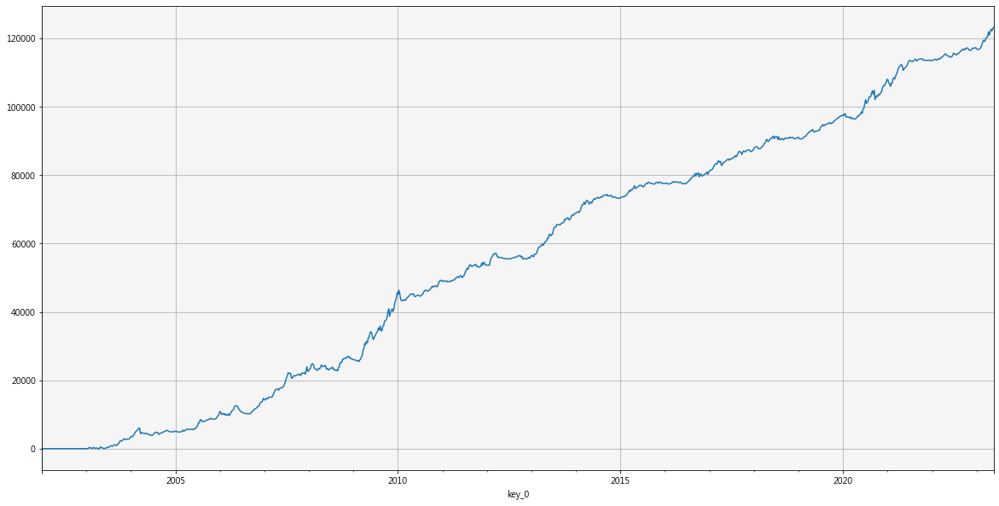

In [151]:
權重關鍵 = trr.sort_index().sum(axis = 1)*0.5*部位['權重']
權重放空 = trrs.sort_index().sum(axis = 1)
權重低接 = trrkd.sort_index().sum(axis = 1)*部位['權重']
權重融資 = trrmm.sort_index().sum(axis = 1)*1.5*部位['權重']
權重X = trrmmstop.sort_index().sum(axis = 1)*3*部位['權重']
權重夏普 = trrmsharpe.sort_index().sum(axis = 1)*6*部位['權重']
權重加總 = 權重關鍵 + 權重放空 + 權重低接 + 權重融資 + 權重X + 權重夏普
#權重關鍵.cumsum().plot()
#權重放空.cumsum().plot()
#權重低接.cumsum().plot()
#權重融資.cumsum().plot()
權重加總.cumsum().plot(figsize = (20,10),grid = True)
#所有策略加總.plot()

<AxesSubplot:xlabel='key_0'>

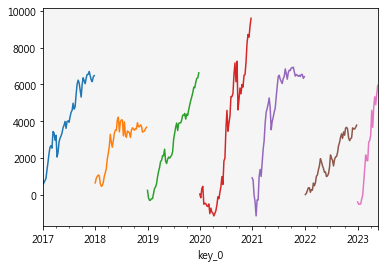

In [152]:
權重加總['2017'].cumsum().plot()
權重加總['2018'].cumsum().plot()
權重加總['2019'].cumsum().plot()
權重加總['2020'].cumsum().plot()
權重加總['2021'].cumsum().plot()
權重加總['2022'].cumsum().plot()
權重加總['2023'].cumsum().plot()

# 個股權重檢查表

In [153]:
from collections import defaultdict

def zero():
    return 0

dict = defaultdict(zero)

if len(關鍵點持有部位) !=0:
    for i in 關鍵點持有部位.index:
        dict[i] += 關鍵點持有部位.loc[i]*0.5
if len(M夏普持有部位) !=0:
    for i in M夏普持有部位進.index:
        dict[i] += M夏普持有部位.loc[i]*6
if len(低接持有部位) !=0:
    for i in 低接持有部位.index:
        dict[i] += 低接持有部位.loc[i]
if len(MM持有部位) !=0:
    for i in MM持有部位.index:
        dict[i] += MM持有部位.loc[i]*1.5
if len(MMstop持有部位) !=0:
    for i in MMstop持有部位.index:
        dict[i] += MMstop持有部位.loc[i]*3

In [154]:
權重部位比對表 = pd.DataFrame.from_dict(dict,orient='index').sort_index().rename(columns = {0:'部位'})
權重部位比對表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重部位比對表\權重部位比對表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
權重部位比對表

,部位
1102,0.5
1103,0.5
1104,0.5
1108,0.5
1109,1.5
1210,0.5
1215,0.5
1216,0.5
1229,0.5
1231,2.0


# 買進權重表

In [155]:
from collections import defaultdict

def zero():
    return 0

dictb = defaultdict(zero)

if len(關鍵點買進) !=0:
    for i in 關鍵點買進.index:
        dictb[i] += 關鍵點買進.loc[i]*0.5
if len(M夏普買進) !=0:
    for i in M夏普買進.index:
        dictb[i] += M夏普買進.loc[i]*6
if len(低接買進) !=0:
    for i in 低接買進.index:
        dictb[i] += 低接買進.loc[i]
if len(MM買進) !=0:
    for i in MM買進.index:
        dictb[i] += MM買進.loc[i]*1.5
if len(MMstop買進) !=0:
    for i in MMstop買進.index:
        dictb[i] += MMstop買進.loc[i]*3

In [156]:
權重買進部位表 = pd.DataFrame.from_dict(dictb,orient='index').sort_index().rename(columns = {0:'買進部位'})
權重買進部位表 = 權重買進部位表.sort_values(by = ['買進部位'])
權重買進部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重買進\權重買進部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
print(權重買進部位表)
print('買進總金額',int(權重買進部位表['買進部位'].sum()*100),'萬')

      買進部位
3094   0.5
5439   0.5
5243   0.5
4747   0.5
4744   0.5
6245   0.5
6274   0.5
3646   0.5
3483   0.5
3479   0.5
3306   0.5
3265   0.5
6569   0.5
3163   0.5
6223   0.5
6672   0.5
6179   0.5
3025   0.5
8099   0.5
8155   0.5
2201   0.5
2457   0.5
2399   0.5
6698   0.5
9930   3.0
9927   3.0
8942   3.0
8930   3.0
6558   3.0
8463   3.0
8240   3.0
8074   3.0
6577   3.0
6803   3.0
6486   3.0
1307   3.0
4706   3.0
6126   3.0
1604   3.0
1731   3.0
2115   3.0
2420   3.0
2423   3.0
2493   3.0
6189   3.0
2901   3.0
2640   3.0
3052   3.0
3206   3.0
3257   3.0
4417   3.0
4506   3.0
4533   3.0
9944   3.0
9951   3.0
2536   3.5
2467   3.5
9911   3.5
3028   3.5
買進總金額 11900 萬


In [157]:
from collections import defaultdict

def zero():
    return 0

dicts = defaultdict(zero)

if len(關鍵點賣出) !=0:
    for i in 關鍵點賣出.index:
        dicts[i] += 關鍵點賣出.loc[i]-0.5
if len(M夏普賣出) !=0:
    for i in M夏普賣出.index:
        dicts[i] += M夏普賣出.loc[i]-6
if len(低接賣出) !=0:
    for i in 低接賣出.index:
        dicts[i] += 低接賣出.loc[i]-1
if len(MM賣出) !=0:
    for i in MM賣出.index:
        dicts[i] += MM賣出.loc[i]-2
if len(MMstop賣出) !=0:
    for i in MMstop賣出.index:
        dicts[i] += MMstop賣出.loc[i]-3

In [158]:
權重賣出部位表 = pd.DataFrame.from_dict(dicts,orient='index').sort_index().rename(columns = {0:'賣出部位'})
權重賣出部位表 = 權重賣出部位表.sort_values(by = ['賣出部位'],ascending=False)
權重賣出部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重賣出\權重賣出部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
print(權重賣出部位表)
print("賣出總金額",int(權重賣出部位表['賣出部位'].sum()*100),'萬')


      賣出部位
1104  -2.0
1108  -2.0
4572  -2.0
1786  -2.5
賣出總金額 -850 萬


# 每日買賣總表

In [159]:
每日買賣總表 = pd.concat([權重買進部位表.reset_index(drop = False).rename(columns = {'index':'買進部位'}),權重賣出部位表.reset_index(drop = False).rename(columns = {'index':'賣出部位'})],axis =1)
每日買賣總表
每日買賣總表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\每日買賣總表\每日買賣總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [160]:
每日買賣總表

,買進部位,買進部位,賣出部位,賣出部位
0,3094,0.5,1104,-2.0
1,5439,0.5,1108,-2.0
2,5243,0.5,4572,-2.0
3,4747,0.5,1786,-2.5
4,4744,0.5,NaN,NaN
5,6245,0.5,NaN,NaN
6,6274,0.5,NaN,NaN
7,3646,0.5,NaN,NaN
8,3483,0.5,NaN,NaN
9,3479,0.5,NaN,NaN


# 部位查詢檔

In [161]:
權重部位比對表['部位']['6680']

3.0

# 淨買賣超金額

In [162]:
買進金額 = 權重買進部位表['買進部位'].sum()*100
賣出金額 = 權重賣出部位表['賣出部位'].sum()*100
淨買賣超金額 = 買進金額 + 賣出金額
print(int(淨買賣超金額),'萬')


11050 萬


In [163]:
#DDW['5234'].tail(20)

In [164]:
DDW['2330']['大盤夏普'].tail(3)

日期
2023-05-12   -0.210928
2023-05-19    0.018122
2023-05-26    0.018122
Freq: W-FRI, Name: 大盤夏普, dtype: float64